In [ ]:
!pip install --upgrade pandas_profiling --user

     |████████████████████████████████| 266kB 2.8MB/s 
     |████████████████████████████████| 3.1MB 6.0MB/s 
     |████████████████████████████████| 71kB 7.1MB/s 
     |████████████████████████████████| 71kB 6.8MB/s 
     |████████████████████████████████| 604kB 30.4MB/s 
     |████████████████████████████████| 71kB 8.6MB/s 
     |████████████████████████████████| 296kB 28.3MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27085 sha256=1adcbfe091209499dcec2c2020fa92616af79af5e973e4fdcde26b1436b8f795
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for imagehash: filename=ImageHash-4.1.0-py2.py3-none-any.whl size=291991 sha256=22ca1d4b044c683a039e95988d2a511242222d839bd92d3c725fb00e0d845088
  Stored in directory: /root/.cache/pip/wheels/07/1c/dc/6831446f09feb8cc199ec73a0f2f0703253f6ae013a22f4be9
Successfully built htmlmin imagehash
  Consider adding this directory to PATH or, if yo

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as st
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
import pandas_profiling
from google.colab import drive
from urllib.request import urlopen
%matplotlib inline
from sklearn.cluster import DBSCAN
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.manifold import TSNE
import umap

ModuleNotFoundError: ignored

#Read the data

In [ ]:
drive.mount('/content/drive')

KeyboardInterrupt: ignored

In [ ]:
data = pd.read_csv('/content/drive/My Drive/epam/data/bank-additional-full.csv',sep=';')

In [ ]:
DATASET_URL = 'https://www.dropbox.com/s/g1jrcnrcnjxk9ap/bank-additional-full.csv?dl=1'
DESCRIPTION_URL = 'https://www.dropbox.com/s/bsandlpaele9ww4/description.txt?dl=1'

data = pd.read_csv(DATASET_URL, sep=';')

In [ ]:
data_category = data.loc[:,np.array(data.dtypes=='object')]
data_numeric = data.loc[:,np.array(data.dtypes!='object')]
category_features = list(data.columns[np.array(data.dtypes=='object')])
numeric_features = list(data.columns[np.array(data.dtypes!='object')])

#Auxilarity methods

In [ ]:
def plot_dist_categ(feat, data1=data):
  plt.figure(figsize=(25, 5))
  sns.countplot(x=feat, data=data1)
  plt.show()

In [ ]:
def plot_dist_cat_y(feat,data1=data):
  plt.figure(figsize=(25, 5))
  sns.countplot(x='y',hue=feat, data=data1)
  plt.show()

In [ ]:
def plot_dist_y_cat(feat, data1=data):
  plt.figure(figsize=(25, 5))
  sns.countplot(x=feat, hue='y', data=data)
  plt.show()

In [ ]:
def categ_depend_test(feat,data1=data):
  data_crosstab = pd.crosstab(data1[feat],  
                              data1['y'], 
                                  margins = False) 
  print('Contingency tabel')
  print(data_crosstab)
  stat, p, dof, expected = st.chi2_contingency(data_crosstab)
  print('Гипотеза H0: переменные независимы\nГипотеза H1: пременные зависимы')
  alpha = 0.05
  if p <= alpha:
    print('Гипотеза H0 отклонена')
  else:
    print('Нельзя отвергнуть гипотезу H0')

In [ ]:
def statistical_indicators(feat):
  print("Статистические показатели для \'{0}\' при y='no'".format(feat))
  print(data[data.y=='no'][feat].describe())
  print("Статистические показатели для '{0}' при y='yes'".format(feat))
  print(data[data.y=='yes'][feat].describe())

In [ ]:
def check_normality(feat):
  stat, p = st.normaltest(data[feat])
  # st.shapiro(data[data.y==targ][feat])
  print('Statistics=%.3f, p=%.3f' % (stat, p))
  alpha = 0.05
  if p > alpha:
    print('Нельзя отвергнуть гипотезу о нормальности выборки по признаку \'%s\'' % (feat))
  else:
    print('Гипотеза о нормальности выборки по признаку \'%s\'должна быть отклонена' % (feat))

In [ ]:
def check_normality_with_y(feat, targ):
  stat, p = st.normaltest(data[data.y==targ][feat])
  # st.shapiro(data[data.y==targ][feat])
  print('Statistics=%.3f, p=%.3f' % (stat, p))
  alpha = 0.05
  if p > alpha:
    print('Нельзя отвергнуть гипотезу о нормальности выборки по признаку \'%s\' для целевой переменной \'%s\'' % (feat,targ))
  else:
    print('Гипотеза о нормальности выборки по признаку \'%s\' для целевой переменной \'%s\' должна быть отклонена' % (feat,targ))

#Data description#

In [ ]:
data.head()

In [ ]:
data.info()

In [ ]:
data.describe()

Представленный датасет состоит из 41188 строк, каждая из которых содержит 20 фич. Пропущенных значений нет. Половина фичей относится к категориальным, другая половина к численным. Описательные статистики для численных фичей показывают, что такие свойства как 'age', 'duration', 'campaign', 'pdays', 'previous' могут содержать выбросы, поскольку существует большая разница между минимумом/максмумом и ближайшими к ним квантилями. 

In [ ]:
DESCRIPTION_URL

desc_f = urlopen(DESCRIPTION_URL) 
for line in desc_f:
    print(line)

#Univariate analysis#

Посчитаем количество значений в каждой из категориальных фич

In [ ]:
# table = []
# for column in data_category.columns:
#     print(column)
#     table.append([name + str(data_category[column].value_counts()[name]) for name in data_category[column].value_counts().index])
tabel = pd.DataFrame([[name + '    ' + str(data_category[column].value_counts()[name]) for name in data_category[column].value_counts().index] for column in data_category.columns]).T
tabel.columns = data_category.columns

In [ ]:
tabel

##Pandas profiling##

Соберем более полную информацию о данных с помощью pandas_profiling

In [ ]:
profiling_report = pandas_profiling.ProfileReport(data)

In [ ]:
profiling_report.to_widgets()

##Target analysis##

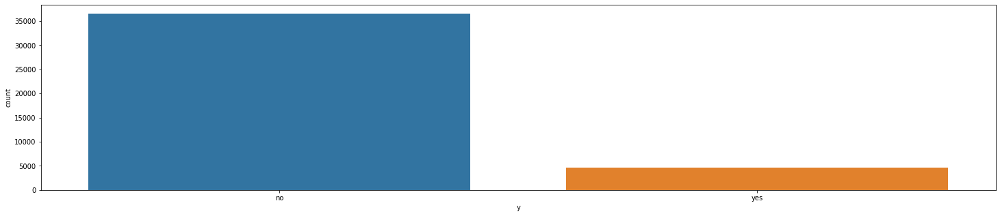

In [ ]:
plt.figure(figsize=(25, 5))
sns.countplot(x='y', data=data)
plt.show()

Как видим из графика, данные сильно несбалансированны, что может создать множество неудобств при построении моделей в дальнейшем.

###Continuous features###
Построим гистограммы для всех численных признаков



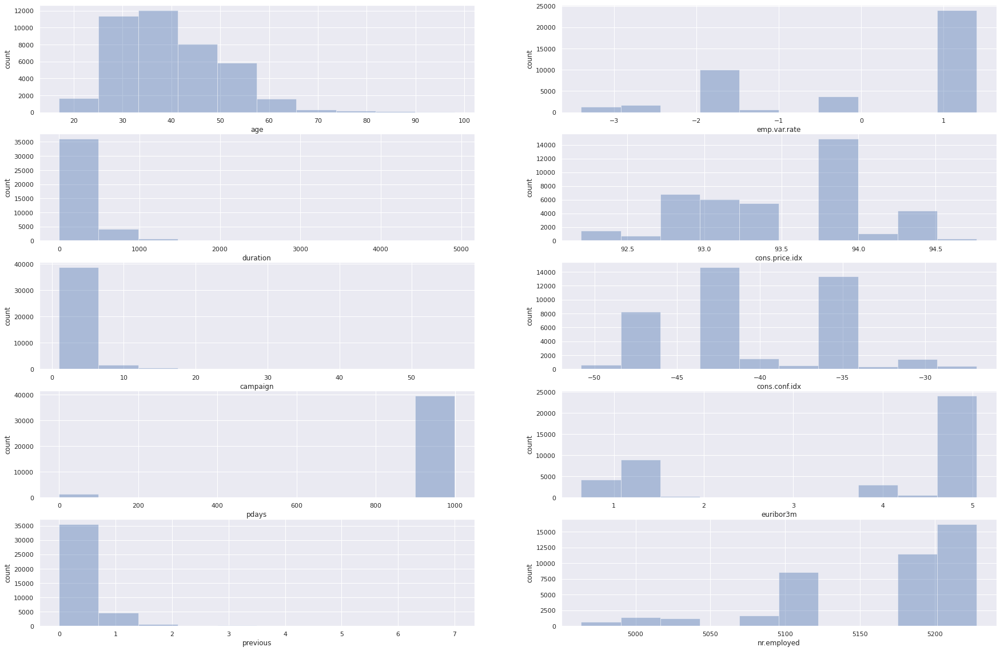

In [ ]:
sns.set(font_scale=1)
fig, axes = plt.subplots(nrows = 5, ncols = 2,figsize=(30,20))
i=1
j=1
for column in numeric_features:
  sns.distplot(data_numeric[column], ax=axes[i-1,j-1], bins=10, kde=False)
  axes[i-1,j-1].set_ylabel('count')
  if i%5==0:
    j+=1
    i=1
  else:
    i+=1

Исходя из полученных графиков, нельзя сделать каких-то предположений относительно распределений, можно лишь предположить что как уже говорилось ранее, в данных есть выбросы.

Рассмотрим теперь каждый численный признак отдельно
####Age##


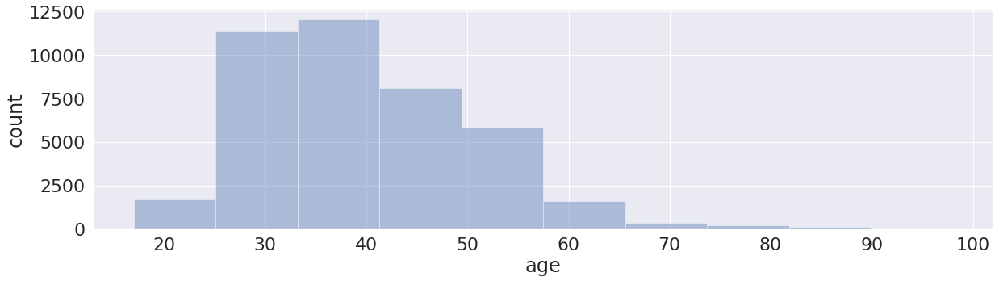

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['age'], bins=10, kde=False)
plt.ylabel('count')
plt.show()

Исходя из вида гистограммы, нельзя сделать каких-либо выводов или предположений, давайте посмотрим на распределения для разных значений целевой переменной и также построим ящики с усами для выявления возможных выбросов.

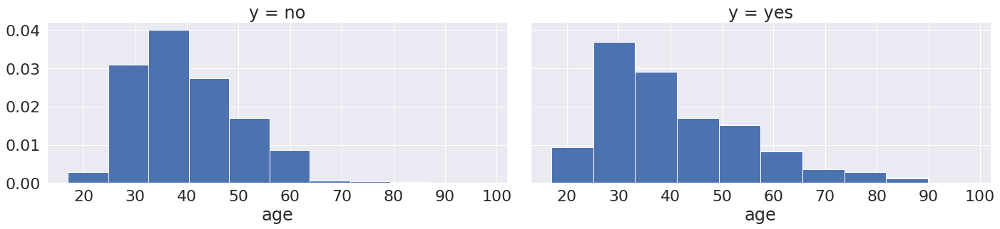

In [ ]:
g = sns.FacetGrid(data, col="y", height=5,aspect=2, palette="muted")
g = g.map(plt.hist, "age", density=True)

Как видим, признаки имеют разное смещение, и обе гистограммы не похожи на нормальное распределение.
На всякий случай проверим это.

In [ ]:
check_normality_with_y('age','no')
check_normality_with_y('age','yes')

Statistics=2324.997, p=0.000
Гипотеза о нормальности выборки по признаку 'age' для целевой переменной 'no' должна быть отклонена
Statistics=601.289, p=0.000
Гипотеза о нормальности выборки по признаку 'age' для целевой переменной 'yes' должна быть отклонена


Проверим взяты ли выборки из одного распределения

In [ ]:
stat, p = st.ks_2samp(data[data.y=='yes']['age'], data[data.y=='no']['age'])
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения')
else:
  print('Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена')

Statistics=0.086, p=0.000
Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена


Теперь посмотрим на "ящики c усами"

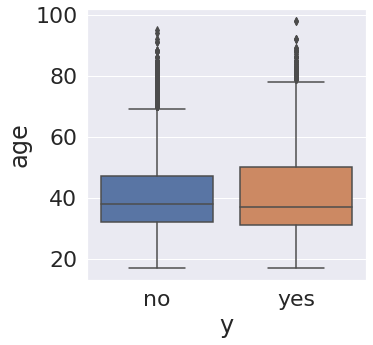

In [ ]:
plt.figure(figsize=(5,5))
sns.boxplot(x='y', y='age', data=data)
plt.show()

Из графика видно, что распределения для таргета 'no' медиана больше, но при этом правый хвост более размыт. Посмотрим на значения медиан, средних и тд.


In [ ]:
statistical_indicators('age')

Статистические показатели для 'age' при y='no'
count    36548.000000
mean        39.911185
std          9.898132
min         17.000000
25%         32.000000
50%         38.000000
75%         47.000000
max         95.000000
Name: age, dtype: float64
Статистические показатели для 'age' при y='yes'
count    4640.000000
mean       40.913147
std        13.837476
min        17.000000
25%        31.000000
50%        37.000000
75%        50.000000
max        98.000000
Name: age, dtype: float64


####Duration##

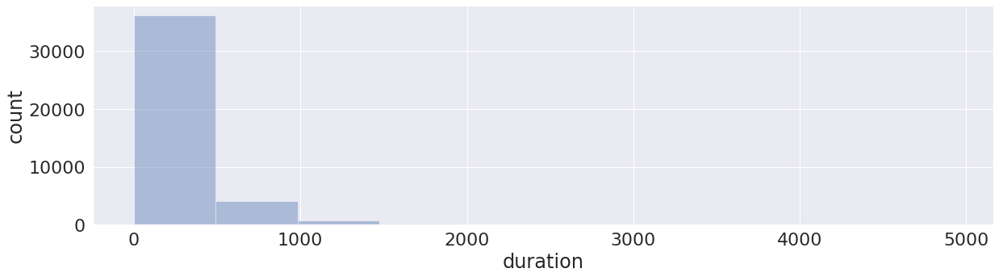

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['duration'], bins=10, kde=False)
plt.ylabel('count')
plt.show()

По виду гистограммы напоминают экспоненциальный закон распределения, проверим это

In [ ]:
stat, p = st.kstest(data['duration'], 'expon')
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что данные распределены экспоненциально')
else:
  print('Гипотеза о том, что данные распределены экспоненциально должна быть отклонена')

Statistics=0.997, p=0.000
Гипотеза о том, что данные распределены экспоненциально должна быть отклонена


Разделим данные согласно таргету


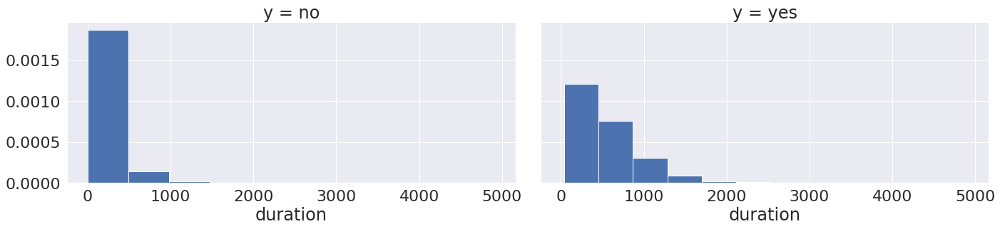

In [ ]:
g = sns.FacetGrid(data, col="y", height=5,aspect=2, palette="muted")
g = g.map(plt.hist, "duration", density=True)

Видим, что распределения сильно отличаются, скорее всего это связано с тем что звонки на которые не ответили получают значение таргета 'no'. 

In [ ]:
stat, p = st.ks_2samp(data[data.y=='yes']['duration'], data[data.y=='no']['duration'])
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения')
else:
  print('Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена')

Statistics=0.464, p=0.000
Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена


Теперь посмотрим на "ящики c усами" и посмотрим на статистические показатели подвыборок

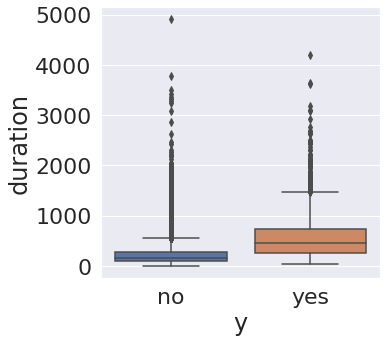

In [ ]:
plt.figure(figsize=(5,5))
sns.boxplot(x='y', y='duration', data=data)
plt.show()

In [ ]:
statistical_indicators('duration')

Статистические показатели для 'duration' при y='no'
count    36548.000000
mean       220.844807
std        207.096293
min          0.000000
25%         95.000000
50%        163.500000
75%        279.000000
max       4918.000000
Name: duration, dtype: float64
Статистические показатели для 'duration' при y='yes'
count    4640.000000
mean      553.191164
std       401.171871
min        37.000000
25%       253.000000
50%       449.000000
75%       741.250000
max      4199.000000
Name: duration, dtype: float64


Исходя из представленных графиков и статистических показателей видно, что медианы подвыборок существенно отличаются, хвост у 'no' значительно длинее. Это может быть объяснено тем, что зачастую отрицательные звонки намного короче по длительности.

####Campaign (number of contacts performed during this campaign and for this client)##

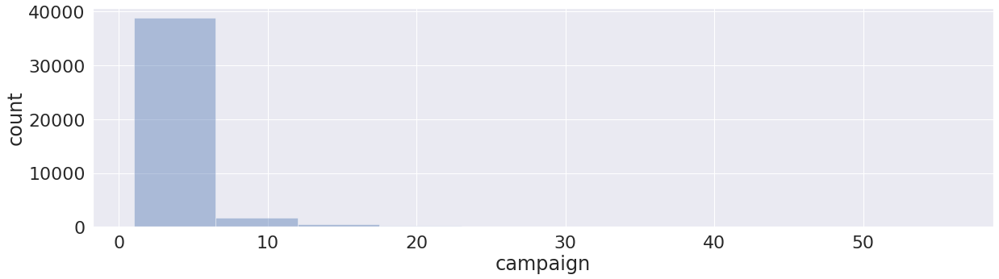

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['campaign'], bins=10, kde=False)
plt.ylabel('count')
plt.show()

Посмотрим количество уникальных элементов признака

In [ ]:
data['campaign'].nunique()

42

Понятно что данная переменная дискретная, значит мы не сможем использовать тест Колмогорова-Смирнова для проверки значимости различия между группами.

Разделим данные согласно таргету


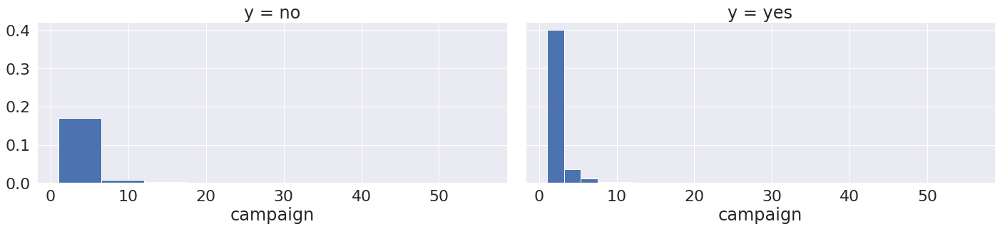

In [ ]:
g = sns.FacetGrid(data, col="y", height=5,aspect=2, palette="muted")
g = g.map(plt.hist, "campaign", density=True)

Видим, что распределения сильно отличаются, у ответов 'yes' более сильное смещение в сторону 0

Теперь посмотрим на "ящики c усами" и посмотрим на статистические показатели подвыборок

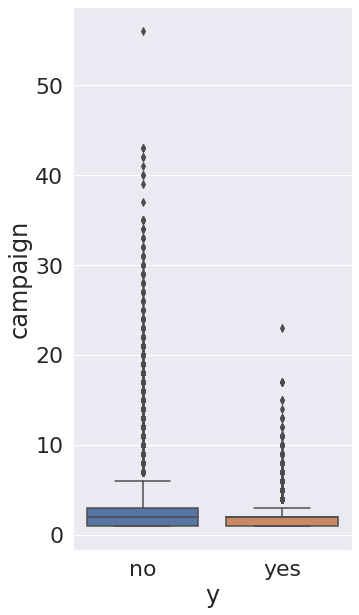

In [ ]:
plt.figure(figsize=(5,10))
sns.boxplot(x='y', y='campaign', data=data)
plt.show()

In [ ]:
statistical_indicators('campaign')

Статистические показатели для 'campaign' при y='no'
count    36548.000000
mean         2.633085
std          2.873438
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         56.000000
Name: campaign, dtype: float64
Статистические показатели для 'campaign' при y='yes'
count    4640.000000
mean        2.051724
std         1.666245
min         1.000000
25%         1.000000
50%         2.000000
75%         2.000000
max        23.000000
Name: campaign, dtype: float64


Исходя из представленных графиков и статистических показателей видно, что медианы подвыборок равны, но при этом большое отличие в максимальных значениях. Скорее всего это связано с малым количеством уникальных значений. Также исходя из вида "ящиков с усами", что значения > 6 для таргета 'no' и > 3 для таргета 'yes' можно считать выбросами.

####Pdays (number of days that passed by after the client was last contacted from a previous campaignt)##

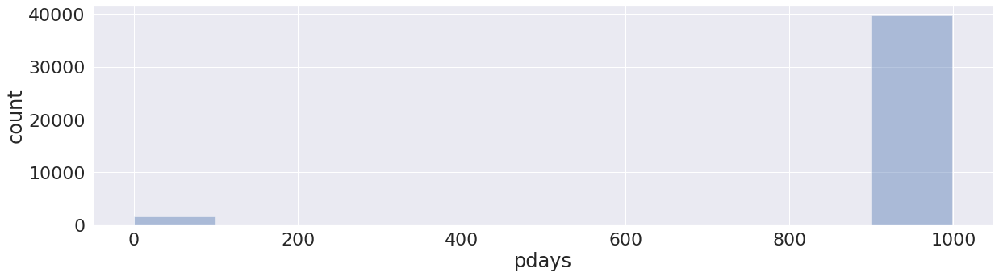

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['pdays'], bins=10, kde=False)
plt.ylabel('count')
plt.show()

Из вида гистограммы нельзя сделать какие-то выводы, только что огромное смещиение в сторону 1000. Это связано с тем что клиентам с которыми ранее не связывались, ставили значение 'pdays' равным 999. Проверим это, для этого посмотрим количество уникальных значений

In [ ]:
data['pdays'].nunique()

27

Как и в прошлом случае, здесь имеем дело с дискретной переменной. Теперь посмотри распредление значений переменной

In [ ]:
data['pdays'].value_counts()

999    39673
3        439
6        412
4        118
9         64
2         61
7         60
12        58
10        52
5         46
13        36
11        28
1         26
15        24
14        20
8         18
0         15
16        11
17         8
18         7
19         3
22         3
21         2
26         1
20         1
25         1
27         1
Name: pdays, dtype: int64

Как  и следовало ожидать, большинство обзваниваемых клиентов были из, тех с кем ранее не связывались. Попробуем посмотреть только клиентов с которыми связывались ранее.


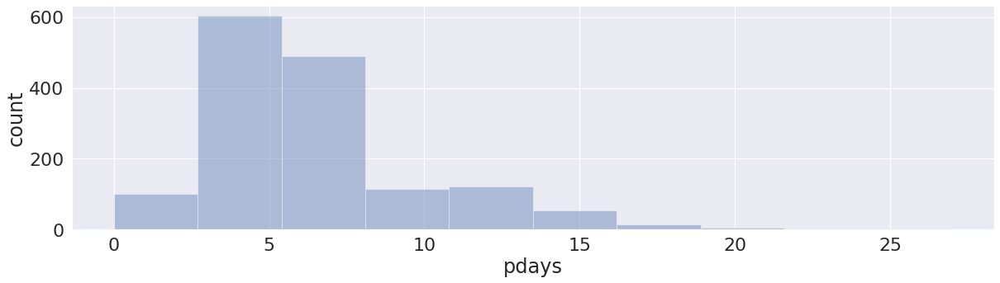

In [ ]:
new_clients = data[data.pdays!=999]
plt.figure(figsize=(20, 5))
sns.distplot(new_clients['pdays'], bins=10, kde=False)
plt.ylabel('count')
plt.show()

Разделим данные согласно таргету

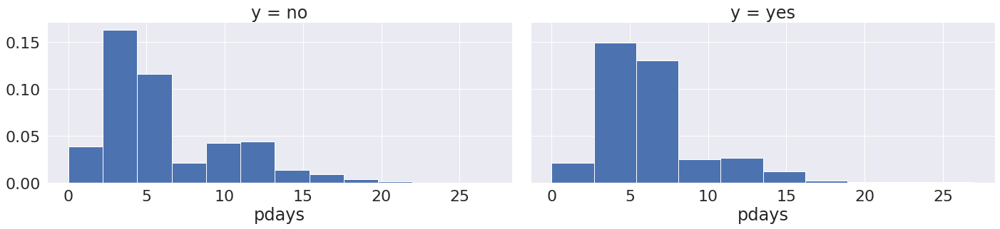

In [ ]:
g = sns.FacetGrid(new_clients, col="y", height=5,aspect=2, palette="muted")
g = g.map(plt.hist, "pdays", density=True)

В целом графики получились похожими. Проверим значимость различия в данных

In [ ]:
stat, p = st.ks_2samp(new_clients[new_clients.y=='yes']['pdays'], new_clients[new_clients.y=='no']['pdays'])
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения')
else:
  print('Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена')

Statistics=0.066, p=0.086
Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения


Проверим тест Краскела — Уоллиса , который тестирует нулевую гипотезу о равенстве медианы в подгруппах.

In [ ]:
stat, p = st.kruskal(new_clients[new_clients.y=='yes']['pdays'],
                              new_clients[new_clients.y=='no']['pdays'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве медиан')
else:
  print('Гипотеза о равенстве медиан должна быть отклонена')

Statistics=0.756, p=0.385
Нельзя отвергнуть гипотезу о равенстве медиан


И тест Уилкоксона

In [ ]:
stat, p = st.ranksums(
    new_clients[new_clients.y=='yes']['pdays'],
    new_clients[new_clients.y=='no']['pdays']
)
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве средних')
else:
  print('Гипотеза о равенстве средних должна быть отклонена')

Statistics=-0.850, p=0.396
Нельзя отвергнуть гипотезу о равенстве средних


Во всех тестах получили одинаковый результат, значит выборки взяты из одного распределения. 

In [ ]:
new_clients[new_clients.y == 'no'].pdays.describe()

count    548.000000
mean       6.193431
std        3.987525
min        0.000000
25%        3.000000
50%        6.000000
75%        9.000000
max       22.000000
Name: pdays, dtype: float64

In [ ]:
new_clients[new_clients.y == 'yes'].pdays.describe()

count    967.000000
mean       5.913133
std        3.727896
min        0.000000
25%        3.000000
50%        6.000000
75%        6.000000
max       27.000000
Name: pdays, dtype: float64

Медианы получились равными, а средние отличаются всего на 0,2. Построим ящик с усами

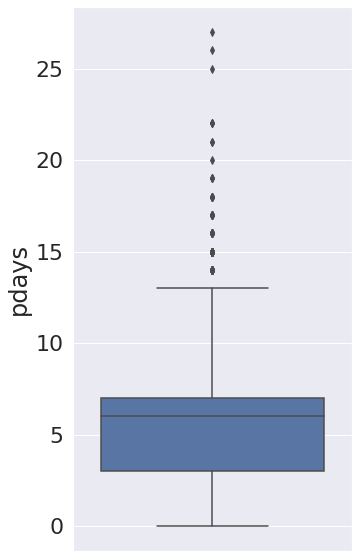

In [ ]:
plt.figure(figsize=(5,10))
sns.boxplot(y='pdays', data=new_clients)
plt.show()

Значения больше 13 и не равные 999 могут быть выбросами

####Previous (number of contacts performed before this campaign and for this client)##

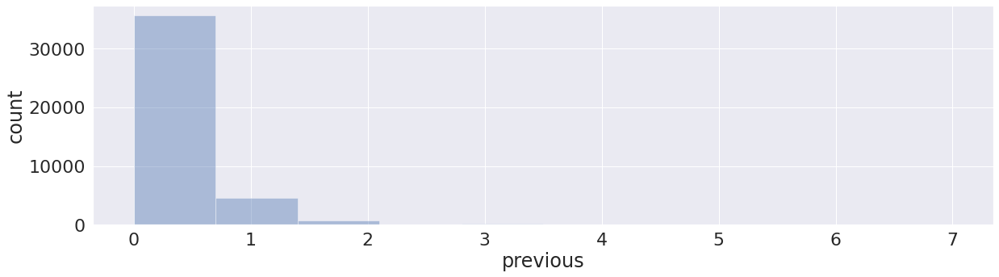

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['previous'], bins=10, kde=False)
plt.ylabel('count')
plt.show()

Получили гистограмму похожую на те, что были в переменных 'campaign' и 'duration', возможно эти переменные связаны, проверим это позже.

In [ ]:
data['previous'].nunique()

8

Как и в предыдущих случаях, здесь имеем дело с дискретной переменной, только значений еще и намного меньше. Теперь посмотри распредление значений переменной

In [ ]:
data['previous'].value_counts()

0    35563
1     4561
2      754
3      216
4       70
5       18
6        5
7        1
Name: previous, dtype: int64

Как  и следовало ожидать, большинство обзваниваемых клиентов были из тех, с кем ранее не связывались, но вот что странно, данные по переменной 'during' гласят, что новых клиентов с которыми ранее не связывались 39673, здесь же таких клиентов 35563. Ппопробуем посмотреть распределение без тех клиентов, с кем ранее не было контактов.

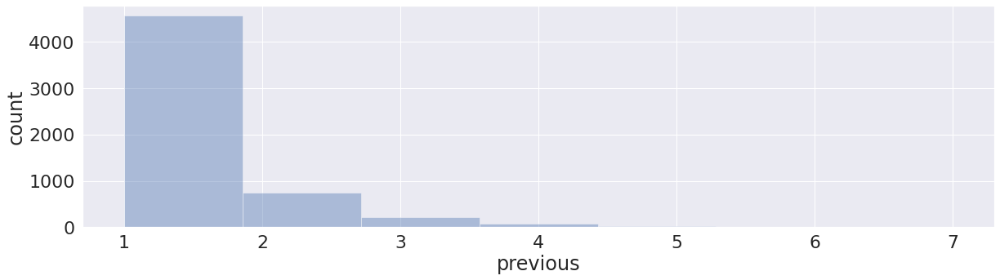

In [ ]:
old_clients = data[data.previous!=0]
plt.figure(figsize=(20, 5))
sns.distplot(old_clients['previous'], bins=7, kde=False)
plt.ylabel('count')
plt.show()

Разделим данные согласно таргету

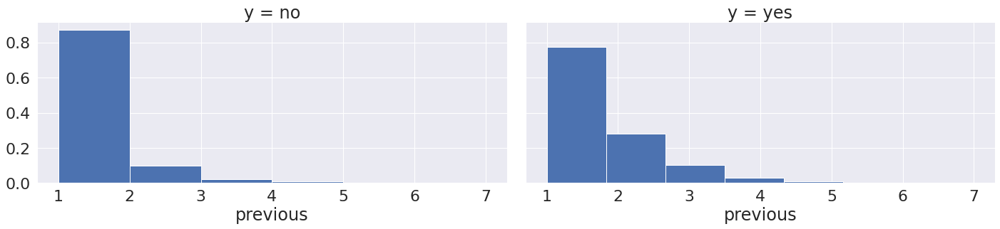

In [ ]:
g = sns.FacetGrid(old_clients, col="y", height=5,aspect=2, palette="muted")
g = g.map(plt.hist, "previous", density=True, bins = 6)

In [ ]:
new_clients[old_clients.y=='no']['previous'].value_counts()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


1    349
2    124
3     47
4     23
5      3
7      1
6      1
Name: previous, dtype: int64

In [ ]:
new_clients[old_clients.y=='yes']['previous'].value_counts()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


1    516
2    281
3    119
4     35
5     13
6      3
Name: previous, dtype: int64

Как и следовало ожидать, при "y=no" большинство значений равны 1, это объясняентся тем, что клиенты зачастую отказываются после первого контакта. Однако такая же тенденция происходит и при "y=yes", тогда проще правильнее будет сделать вывод, что сделка совершается или происходит отказ во время первого звонка. Однако и это будет не совсем правильным выводом, посколько представлены данные о контактах до настоящей компании, поэтому можно предположить, что количество звонков также показывает насколько давно клиент в банке, чем больше контактов тем давнее клиент пришел в банк. В целом графики получились похожими. Проверим значимость различия в данных

In [ ]:
stat, p = st.ks_2samp(old_clients[old_clients.y=='yes']['previous'],
                      old_clients[old_clients.y=='no']['previous'])
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения')
else:
  print('Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена')

Statistics=0.226, p=0.000
Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена


Проверим тест Краскела — Уоллиса , который тестирует нулевую гипотезу о равенстве медианы в подгруппах.

In [ ]:
stat, p = st.kruskal(old_clients[old_clients.y=='yes']['previous'],
                     old_clients[old_clients.y=='no']['previous'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве медиан')
else:
  print('Гипотеза о равенстве медиан должна быть отклонена')

Statistics=377.551, p=0.000
Гипотеза о равенстве медиан должна быть отклонена


И тест Уилкоксона

In [ ]:
stat, p = st.ranksums(
    old_clients[old_clients.y=='yes']['previous'],
    old_clients[old_clients.y=='no']['previous']
)
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве средних')
else:
  print('Гипотеза о равенстве средних должна быть отклонена')

Statistics=13.242, p=0.000
Гипотеза о равенстве средних должна быть отклонена


Во всех тестах получили одинаковый результат, значит разница между выборками статистически значима. 

In [ ]:
old_clients[old_clients.y == 'no'].previous.describe()

count    4126.000000
mean        1.172564
std         0.513369
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         7.000000
Name: previous, dtype: float64

In [ ]:
old_clients[old_clients.y == 'yes'].previous.describe()

count    1499.000000
mean        1.525017
std         0.846658
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         6.000000
Name: previous, dtype: float64

Медианы получились равными, хотя тест Красскала-Уоллеса утверждает обратное, это связано с тем, что имеем дело с дискретными данными и данный тест на них просто не работает. Средние отличаются на 0,4. Построим ящик с усами

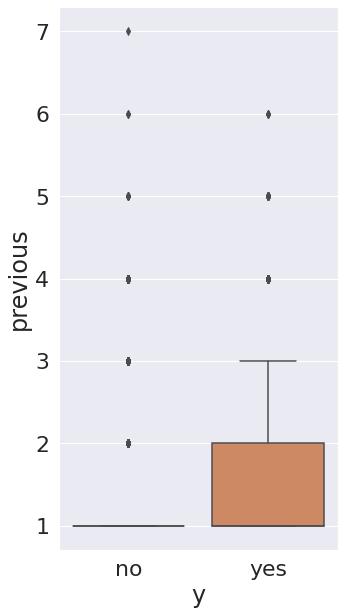

In [ ]:
plt.figure(figsize=(5,10))
sns.boxplot(x='y',y='previous', data=old_clients)
plt.show()

Получили то, чего и следовало ожидать, при 'y=no' значение 1 присутствует в 87% случаев, при 'y=yes' ситуация уже получше.

####Employment variation rate - quarterly indicator##

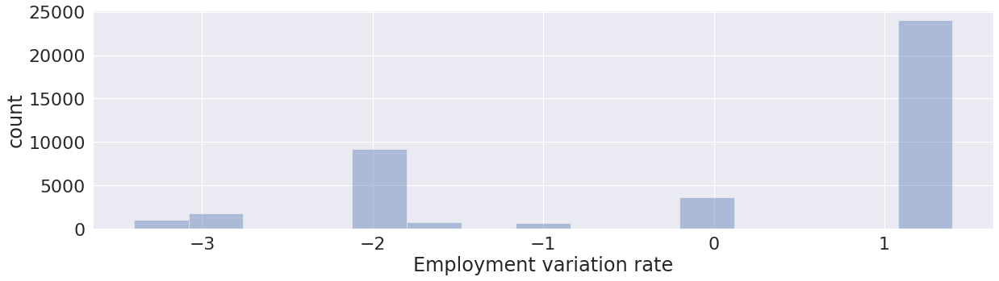

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['emp.var.rate'], bins=15, kde=False)
plt.ylabel('count')
plt.xlabel('Employment variation rate')
plt.show()

По данной гистограмме трудно сделть какие-ибо выводы.

In [ ]:
data['emp.var.rate'].nunique()

10

Как и в предыдущих случаях, здесь имеем дело с дискретной переменной, значений все также мало. Теперь посмотрим распредление значений переменной

In [ ]:
data['emp.var.rate'].value_counts()

 1.4    16234
-1.8     9184
 1.1     7763
-0.1     3683
-2.9     1663
-3.4     1071
-1.7      773
-1.1      635
-3.0      172
-0.2       10
Name: emp.var.rate, dtype: int64

In [ ]:
data[data['emp.var.rate']>0]['emp.var.rate'].count()/data['emp.var.rate'].count()

0.582621151791784

Большинство клиентов имеют положительный показатель 'emp.var.rate'

Разделим данные согласно таргету

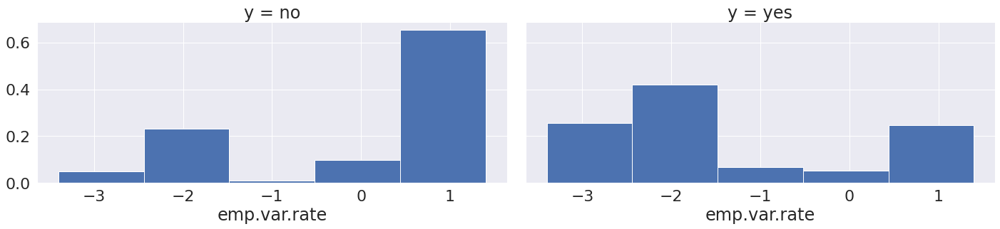

In [ ]:
g = sns.FacetGrid(data, col="y", height=5,aspect=2, palette="muted")
g = g.map(plt.hist, "emp.var.rate", density=True, bins = 5)

In [ ]:
data[data.y=='no']['emp.var.rate'].value_counts()

 1.4    15368
-1.8     7723
 1.1     7523
-0.1     3451
-2.9     1069
-3.4      617
-1.7      370
-1.1      334
-3.0       84
-0.2        9
Name: emp.var.rate, dtype: int64

In [ ]:
data[data.y=='yes']['emp.var.rate'].value_counts()

-1.8    1461
 1.4     866
-2.9     594
-3.4     454
-1.7     403
-1.1     301
 1.1     240
-0.1     232
-3.0      88
-0.2       1
Name: emp.var.rate, dtype: int64

Видим, что большинство среди данных с таргетом 'no', преобладает положительное значение признака 'emp.var.rate', для таргета 'yes' все наоборот.

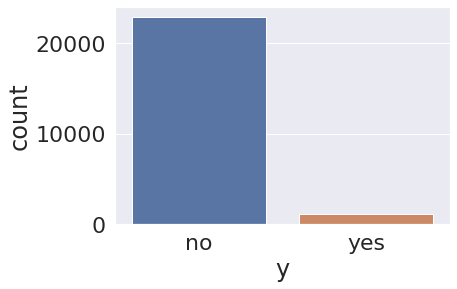

In [ ]:
sns.countplot(x='y',data=data[data['emp.var.rate']>0])

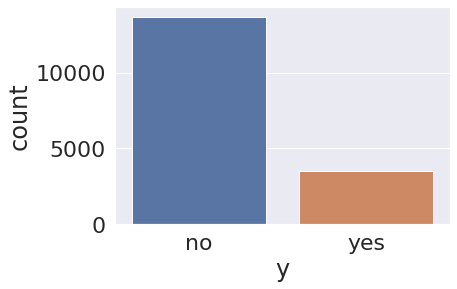

In [ ]:
sns.countplot(x='y',data=data[data['emp.var.rate']<0])

При этом видим, что все равно большинство клиентов имеют таргет 'no', но количество клиентов с отрицательным показателем 'emp.var.rate' с 'y=yes' значительно больше количества людей с такм же 'y' и положительным значением 'emp.var.rate'

In [ ]:
stat, p = st.ks_2samp(data[data.y=='yes']['emp.var.rate'],
                      data[data.y=='no']['emp.var.rate'])
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения')
else:
  print('Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена')

Statistics=0.432, p=0.000
Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена


Проверим тест Краскела — Уоллиса , который тестирует нулевую гипотезу о равенстве медианы в подгруппах.

In [ ]:
stat, p = st.kruskal(data[data.y=='yes']['emp.var.rate'],
                     data[data.y=='no']['emp.var.rate'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве медиан')
else:
  print('Гипотеза о равенстве медиан должна быть отклонена')

Statistics=2522.547, p=0.000
Гипотеза о равенстве медиан должна быть отклонена


И тест Уилкоксона

In [ ]:
stat, p = st.ranksums(
    data[data.y=='yes']['emp.var.rate'],
    data[data.y=='no']['emp.var.rate']
)
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве средних')
else:
  print('Гипотеза о равенстве средних должна быть отклонена')

Statistics=-48.179, p=0.000
Гипотеза о равенстве средних должна быть отклонена


Во всех тестах получили одинаковый результат, значит разница между выборками статистически значима. 

In [ ]:
statistical_indicators('emp.var.rate')

Статистические показатели для 'emp.var.rate' при y='no'
count    36548.000000
mean         0.248875
std          1.482932
min         -3.400000
25%         -1.800000
50%          1.100000
75%          1.400000
max          1.400000
Name: emp.var.rate, dtype: float64
Статистические показатели для 'emp.var.rate' при y='yes'
count    4640.000000
mean       -1.233448
std         1.623626
min        -3.400000
25%        -1.800000
50%        -1.800000
75%        -0.100000
max         1.400000
Name: emp.var.rate, dtype: float64


Медианы получились разными, что подтверждает результаты теста Красскала-Уоллеса утверждает обратное. Средние отличаются значительно. Построим ящик с усами

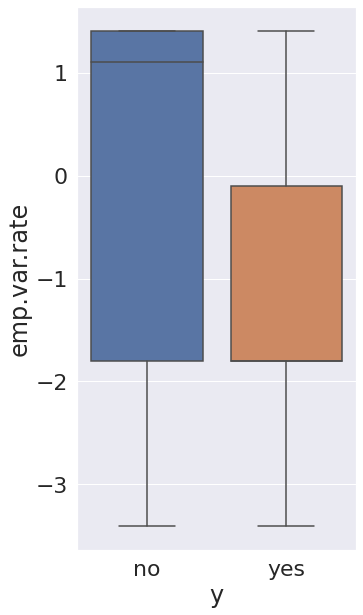

In [ ]:
plt.figure(figsize=(5,10))
sns.boxplot(x='y',y='emp.var.rate', data=data)
plt.show()

In [ ]:
data['emp.var.rate'].value_counts()/data['emp.var.rate'].count()

 1.4    0.394144
-1.8    0.222978
 1.1    0.188477
-0.1    0.089419
-2.9    0.040376
-3.4    0.026003
-1.7    0.018768
-1.1    0.015417
-3.0    0.004176
-0.2    0.000243
Name: emp.var.rate, dtype: float64

Судя по ящикам с усами, здесь нет выбросов, что не удивительно, поскольку минимальное/максимальное значение переменной всречается хотя бы в 0.5% случаев 

####Consumer price index##

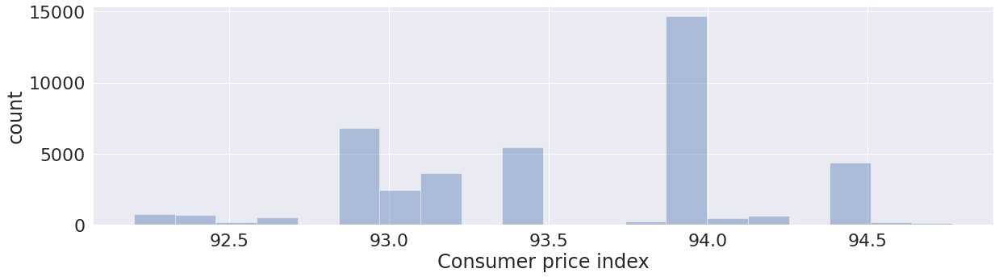

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['cons.price.idx'], bins=20, kde=False)
plt.ylabel('count')
plt.xlabel('Consumer price index')
plt.show()

Разделим данные согласно таргету

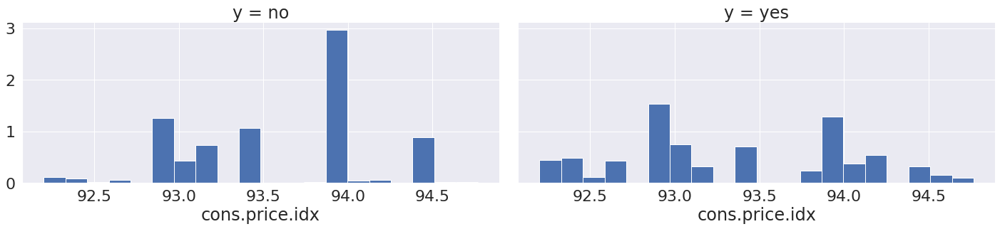

In [ ]:
g = sns.FacetGrid(data, col="y", height=5, aspect=2)
g = g.map(plt.hist, "cons.price.idx", density=True, bins = 20, stacked=True)

Получили не похожие друг на друга гистограммы. Проверим знаимость различия распределений

In [ ]:
stat, p = st.ks_2samp(data[data.y=='yes']['cons.price.idx'],
                      data[data.y=='no']['cons.price.idx'])
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения')
else:
  print('Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена')

Statistics=0.228, p=0.000
Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена


Проверим тест Краскела — Уоллиса , который тестирует нулевую гипотезу о равенстве медианы в подгруппах.

In [ ]:
stat, p = st.kruskal(data[data.y=='yes']['cons.price.idx'],
                     data[data.y=='no']['cons.price.idx'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве медиан')
else:
  print('Гипотеза о равенстве медиан должна быть отклонена')

Statistics=614.909, p=0.000
Гипотеза о равенстве медиан должна быть отклонена


И тест Уилкоксона

In [ ]:
stat, p = st.ranksums(
    data[data.y=='yes']['cons.price.idx'],
    data[data.y=='no']['cons.price.idx']
)
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве средних')
else:
  print('Гипотеза о равенстве средних должна быть отклонена')

Statistics=-24.575, p=0.000
Гипотеза о равенстве средних должна быть отклонена


Во всех тестах получили одинаковый результат, значит разница между выборками статистически значима. 

In [ ]:
statistical_indicators('cons.price.idx')

Статистические показатели для 'cons.price.idx' при y='no'
count    36548.000000
mean        93.603757
std          0.558993
min         92.201000
25%         93.075000
50%         93.918000
75%         93.994000
max         94.767000
Name: cons.price.idx, dtype: float64
Статистические показатели для 'cons.price.idx' при y='yes'
count    4640.000000
mean       93.354386
std         0.676644
min        92.201000
25%        92.893000
50%        93.200000
75%        93.918000
max        94.767000
Name: cons.price.idx, dtype: float64


Медианы получились разными, что подтверждает результаты теста Красскала-Уоллеса. Средние отличаются. Построим ящик с усами

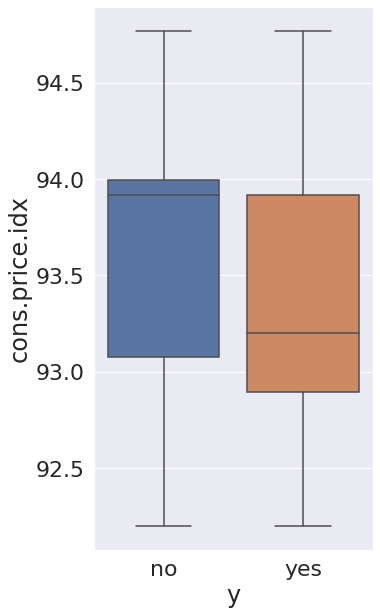

In [ ]:
plt.figure(figsize=(5,10))
sns.boxplot(x='y',y='cons.price.idx', data=data)
plt.show()

In [ ]:
data['cons.price.idx'].value_counts()/data['cons.price.idx'].count()

93.994    0.188477
93.918    0.162305
92.893    0.140672
93.444    0.125643
94.465    0.106196
93.200    0.087793
93.075    0.059678
92.201    0.018695
92.963    0.017359
92.431    0.010853
92.649    0.008668
94.215    0.007551
94.199    0.007357
92.843    0.006847
92.379    0.006482
93.369    0.006410
94.027    0.005657
94.055    0.005560
93.876    0.005147
94.601    0.004953
92.469    0.004322
93.749    0.004225
92.713    0.004176
94.767    0.003108
93.798    0.001627
92.756    0.000243
Name: cons.price.idx, dtype: float64

Судя по ящикам с усами, здесь нет выбросов, что не удивительно, поскольку минимальное/максимальное значение переменной всречается хотя бы в 0.5% случаев 

####Consumer confidence index##

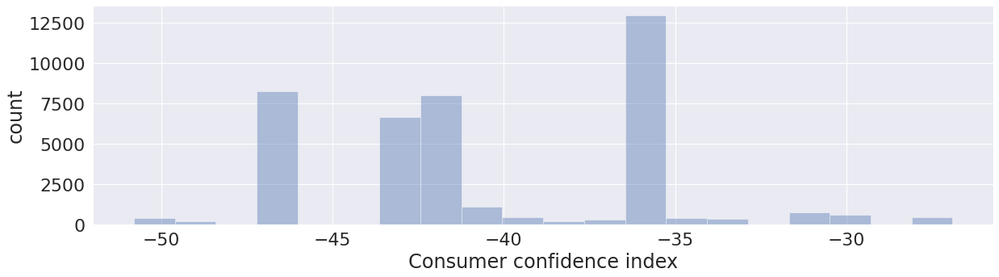

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['cons.conf.idx'], bins=20, kde=False)
plt.ylabel('count')
plt.xlabel('Consumer confidence index')
plt.show()

Разделим данные согласно таргету

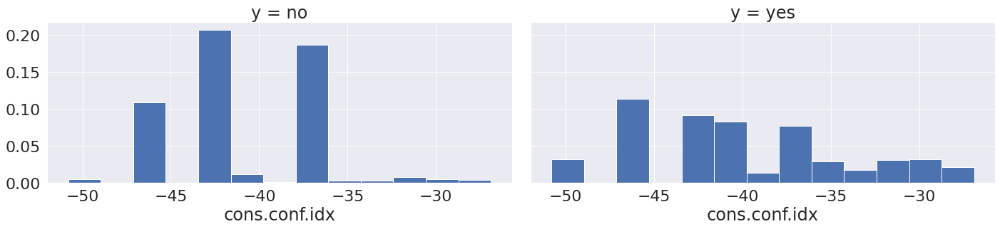

In [ ]:
g = sns.FacetGrid(data, col="y", height=5,aspect=2, palette="muted")
g = g.map(plt.hist, "cons.conf.idx", density=True, bins = 13)

Получили не похожие друг на друга гистограммы. Проверим знаимость различия распределений

In [ ]:
stat, p = st.ks_2samp(data[data.y=='yes']['cons.conf.idx'],
                      data[data.y=='no']['cons.conf.idx'])
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения')
else:
  print('Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена')

Statistics=0.200, p=0.000
Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена


Проверим тест Краскела — Уоллиса , который тестирует нулевую гипотезу о равенстве медианы в подгруппах.

In [ ]:
stat, p = st.kruskal(data[data.y=='yes']['cons.conf.idx'],
                     data[data.y=='no']['cons.conf.idx'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве медиан')
else:
  print('Гипотеза о равенстве медиан должна быть отклонена')

Statistics=70.010, p=0.000
Гипотеза о равенстве медиан должна быть отклонена


И тест Уилкоксона

In [ ]:
stat, p = st.ranksums(
    data[data.y=='yes']['cons.conf.idx'],
    data[data.y=='no']['cons.conf.idx']
)
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве средних')
else:
  print('Гипотеза о равенстве средних должна быть отклонена')

Statistics=8.292, p=0.000
Гипотеза о равенстве средних должна быть отклонена


Во всех тестах получили одинаковый результат, значит разница между выборками статистически значима. 

In [ ]:
statistical_indicators('cons.conf.idx')

Статистические показатели для 'cons.conf.idx' при y='no'
count    36548.000000
mean       -40.593097
std          4.391155
min        -50.800000
25%        -42.700000
50%        -41.800000
75%        -36.400000
max        -26.900000
Name: cons.conf.idx, dtype: float64
Статистические показатели для 'cons.conf.idx' при y='yes'
count    4640.000000
mean      -39.789784
std         6.139668
min       -50.800000
25%       -46.200000
50%       -40.400000
75%       -36.100000
max       -26.900000
Name: cons.conf.idx, dtype: float64


Медианы получились разными, что подтверждает результаты теста Красскала-Уоллеса. Средние отличаются. Построим ящик с усами

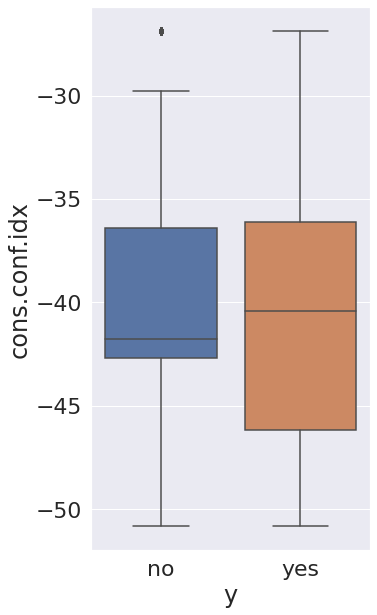

In [ ]:
plt.figure(figsize=(5,10))
sns.boxplot(x='y',y='cons.conf.idx', data=data)
plt.show()

In [ ]:
data[data.y=='no']['cons.conf.idx'].value_counts()/data[data.y=='no']['cons.conf.idx'].count()

-36.4    0.205839
-42.7    0.171774
-46.2    0.144194
-36.1    0.134180
-41.8    0.114534
-42.0    0.093740
-47.1    0.055160
-31.4    0.013845
-40.8    0.012340
-26.9    0.007305
-30.1    0.005171
-29.8    0.004405
-50.0    0.004268
-37.5    0.004186
-40.3    0.003694
-39.8    0.003338
-34.8    0.003119
-38.3    0.003092
-33.6    0.003064
-49.5    0.003037
-40.0    0.002463
-33.0    0.002298
-34.6    0.002107
-50.8    0.001915
-40.4    0.000684
-45.9    0.000246
Name: cons.conf.idx, dtype: float64

Судя по ящикам с усами, у в данных 'y=no' есть выбросы при значении 'cons.conf.idx'> -30

####Euribor 3 month rate##

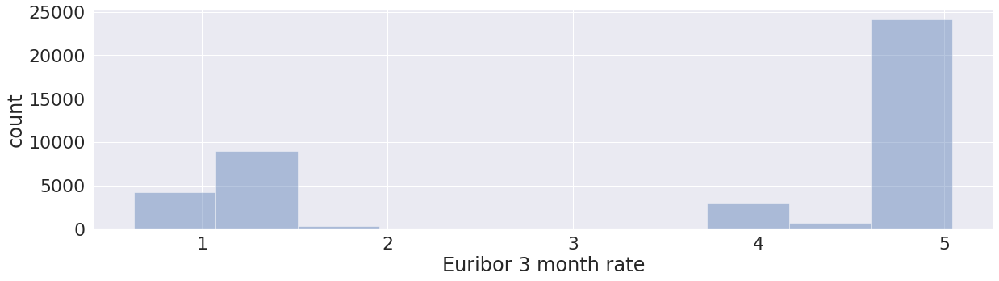

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['euribor3m'], bins=10, kde=False)
plt.ylabel('count')
plt.xlabel('Euribor 3 month rate')
plt.show()

Разделим данные согласно таргету

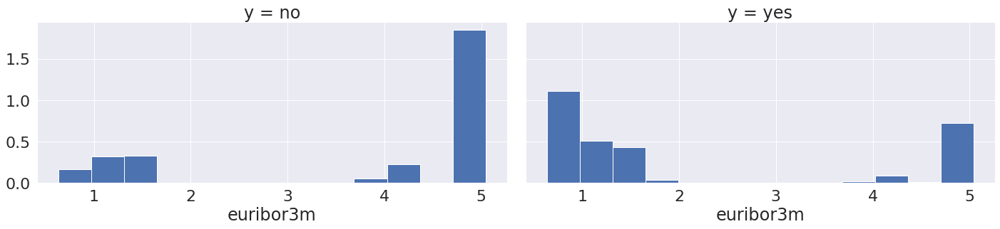

In [ ]:
g = sns.FacetGrid(data, col="y", height=5,aspect=2, palette="muted")
g = g.map(plt.hist, "euribor3m", density=True, bins = 13)

Получили не похожие друг на друга гистограммы. При этом видим что у таргета 'yes' преобладают более низкие значение 'euribor3m'. Проверим знаимость различия распределений

In [ ]:
stat, p = st.ks_2samp(data[data.y=='yes']['euribor3m'],
                      data[data.y=='no']['euribor3m'])
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения')
else:
  print('Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена')

Statistics=0.433, p=0.000
Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена


Проверим тест Краскела — Уоллиса , который тестирует нулевую гипотезу о равенстве медианы в подгруппах.

In [ ]:
stat, p = st.kruskal(data[data.y=='yes']['euribor3m'],
                     data[data.y=='no']['euribor3m'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве медиан')
else:
  print('Гипотеза о равенстве медиан должна быть отклонена')

Statistics=2932.258, p=0.000
Гипотеза о равенстве медиан должна быть отклонена


И тест Уилкоксона

In [ ]:
stat, p = st.ranksums(
    data[data.y=='yes']['euribor3m'],
    data[data.y=='no']['euribor3m']
)
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве средних')
else:
  print('Гипотеза о равенстве средних должна быть отклонена')

Statistics=-54.119, p=0.000
Гипотеза о равенстве средних должна быть отклонена


Во всех тестах получили одинаковый результат, значит разница между выборками статистически значима. 

In [ ]:
statistical_indicators('euribor3m')

Статистические показатели для 'euribor3m' при y='no'
count    36548.000000
mean         3.811491
std          1.638187
min          0.634000
25%          1.405000
50%          4.857000
75%          4.962000
max          5.045000
Name: euribor3m, dtype: float64
Статистические показатели для 'euribor3m' при y='yes'
count    4640.000000
mean        2.123135
std         1.742598
min         0.634000
25%         0.849000
50%         1.266000
75%         4.406000
max         5.045000
Name: euribor3m, dtype: float64


Медианы получились разными, что подтверждает результаты теста Красскала-Уоллеса. Средние отличаются значительно, что подтверждают результаты теста Уилкоксона. Построим ящик с усами

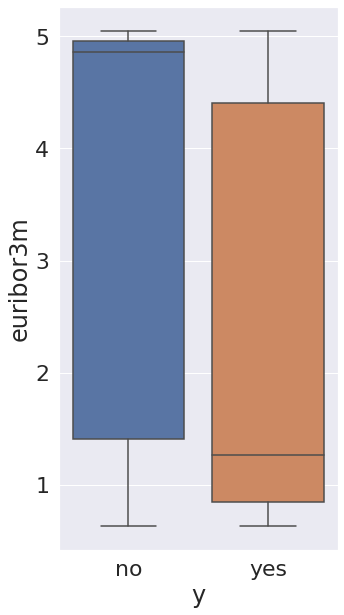

In [ ]:
plt.figure(figsize=(5,10))
sns.boxplot(x='y',y='euribor3m', data=data)
plt.show()

Судя по ящикам с усами, выбросы в данных отсутствуют

####Number of employees##

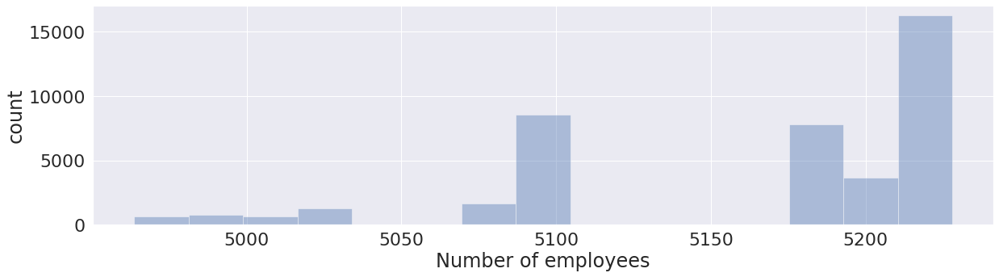

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(20, 5))
sns.distplot(data['nr.employed'], bins=15, kde=False)
plt.ylabel('count')
plt.xlabel('Number of employees')
plt.show()

Разделим данные согласно таргету

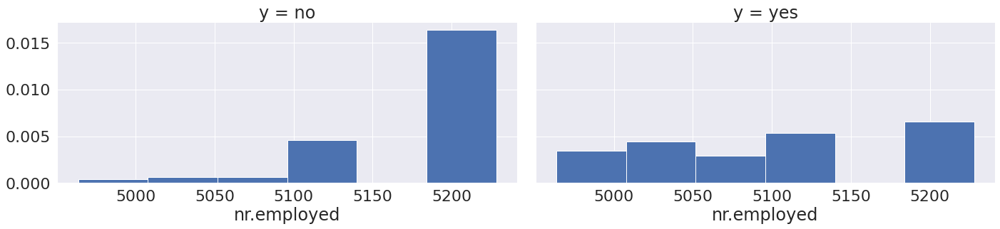

In [ ]:
g = sns.FacetGrid(data, col="y", height=5,aspect=2, palette="muted")
g = g.map(plt.hist, "nr.employed", density=True, bins = 6)

Получили не похожие друг на друга гистограммы. При этом видим что у таргета 'no' преобладают более высокие значение 'nr.employed'. Проверим знаимость различия распределений

In [ ]:
stat, p = st.ks_2samp(data[data.y=='yes']['nr.employed'],
                      data[data.y=='no']['nr.employed'])
alpha = 0.05
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о том, что выборки взяты из одного распределения')
else:
  print('Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена')

Statistics=0.432, p=0.000
Гипотеза о том, что выборки взяты из одного распределения должна быть отклонена


Проверим тест Краскела — Уоллиса , который тестирует нулевую гипотезу о равенстве медианы в подгруппах.

In [ ]:
stat, p = st.kruskal(data[data.y=='yes']['nr.employed'],
                     data[data.y=='no']['nr.employed'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве медиан')
else:
  print('Гипотеза о равенстве медиан должна быть отклонена')

Statistics=3320.974, p=0.000
Гипотеза о равенстве медиан должна быть отклонена


И тест Уилкоксона

In [ ]:
stat, p = st.ranksums(
    data[data.y=='yes']['nr.employed'],
    data[data.y=='no']['nr.employed']
)
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
  print('Нельзя отвергнуть гипотезу о равенстве средних')
else:
  print('Гипотеза о равенстве средних должна быть отклонена')

Statistics=-55.346, p=0.000
Гипотеза о равенстве средних должна быть отклонена


Во всех тестах получили одинаковый результат, значит разница между выборками статистически значима. 

In [ ]:
statistical_indicators('nr.employed')

Статистические показатели для 'nr.employed' при y='no'
count    36548.000000
mean      5176.166600
std         64.571979
min       4963.600000
25%       5099.100000
50%       5195.800000
75%       5228.100000
max       5228.100000
Name: nr.employed, dtype: float64
Статистические показатели для 'nr.employed' при y='yes'
count    4640.000000
mean     5095.115991
std        87.572641
min      4963.600000
25%      5017.500000
50%      5099.100000
75%      5191.000000
max      5228.100000
Name: nr.employed, dtype: float64


Медианы получились разными, что подтверждает результаты теста Красскала-Уоллеса. Средние отличаются значительно, что подтверждают результаты теста Уилкоксона. Построим ящик с усами

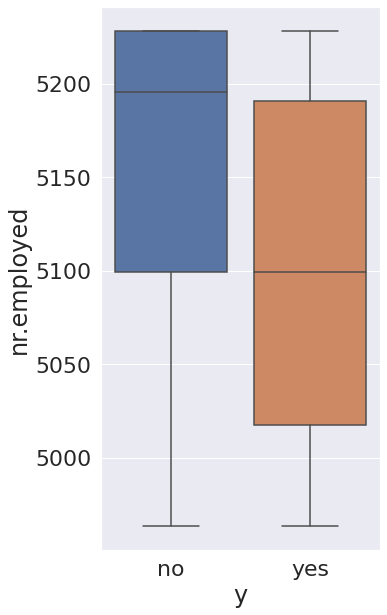

In [ ]:
plt.figure(figsize=(5,10))
sns.boxplot(x='y',y='nr.employed', data=data)
plt.show()

Судя по ящикам с усами, выбросы в данных отсутствуют

Таким образом мы получили, что среди численных признаков только один для нас не значим - pdays

###Categorical features#



####Job (type of job)##
Посмотрим на распределение по категориям

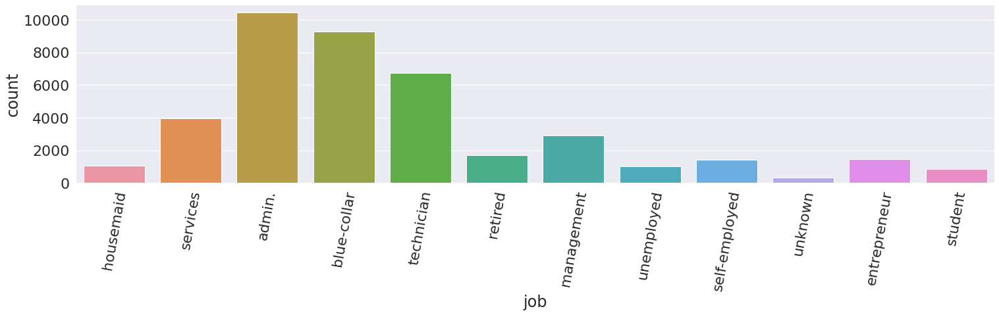

In [ ]:
plt.figure(figsize=(25, 5))
ax = sns.countplot(x='job', data=data)
ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
plt.show()

Большинство клиентов представители администрации, рабочих физического труда или техников. Теперь посмотрим распределение категорий по таргетам.

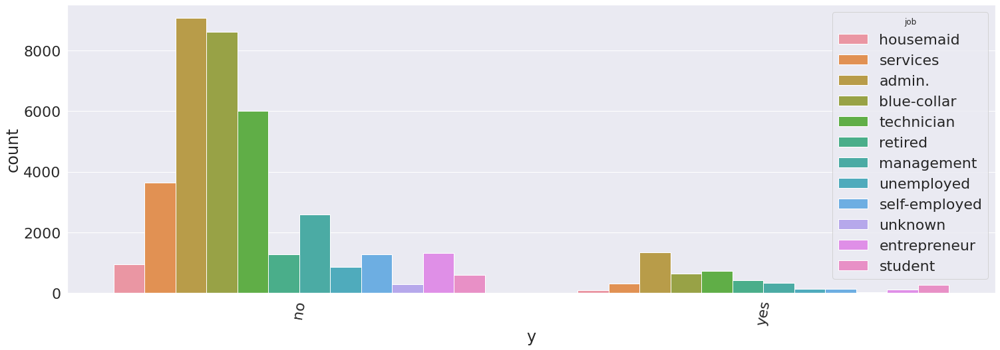

In [ ]:
plt.figure(figsize=(25, 8))
ax = sns.countplot(x='y', hue='job', data=data)
ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
plt.show()

И распределение таргетов по категориям

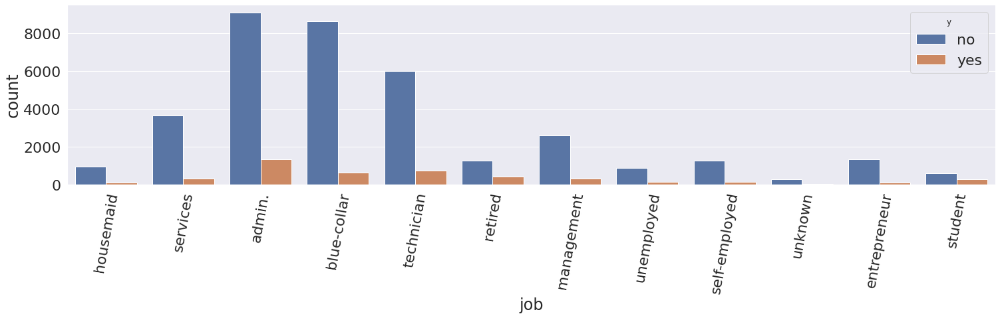

In [ ]:
plt.figure(figsize=(25, 5))
ax = sns.countplot(x='job', hue='y', data=data)
ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
plt.show()

Исходя из вида графиков, можно предположить что данные взяты из одинаковых распределений. Проверим это

In [ ]:
categ_depend_test('job')

Contingency tabel
y                no   yes
job                      
admin.         9070  1352
blue-collar    8616   638
entrepreneur   1332   124
housemaid       954   106
management     2596   328
retired        1286   434
self-employed  1272   149
services       3646   323
student         600   275
technician     6013   730
unemployed      870   144
unknown         293    37
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Гипотеза H0 отклонена


Проведенный тест $\chi^2$ показал что признак 'job' значимый

####Marital status##

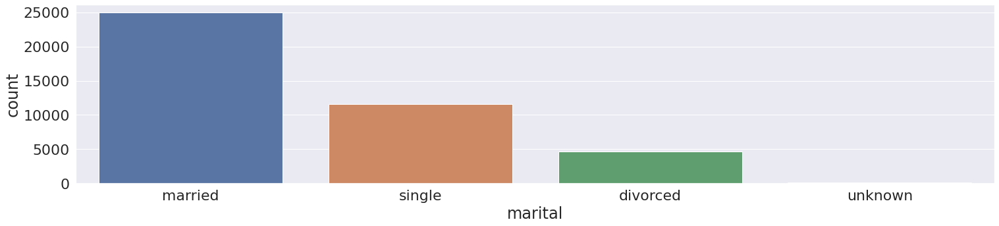

In [ ]:
plot_dist_categ('marital')

Из графика следует: большинство клиентов женаты/замужем. Количество людей с статусом 'unknown' очень мало.
Посмотрим сколько всего людей со статусом 'unknown'

In [ ]:
data[data.marital=='unknown'].marital.count()

80

Разделим данные согласно таргету и посмотрим распределение по категориям

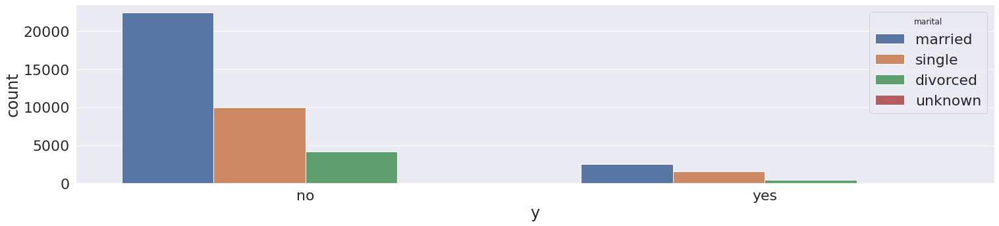

In [ ]:
plot_dist_cat_y('marital')

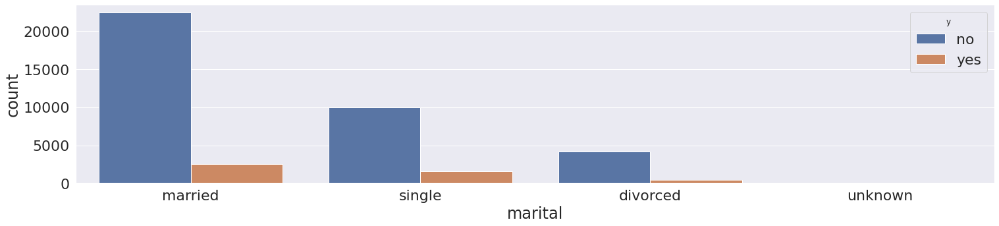

In [ ]:
plot_dist_y_cat('marital')

Посмотрим отдельно на категорию 'unknown'

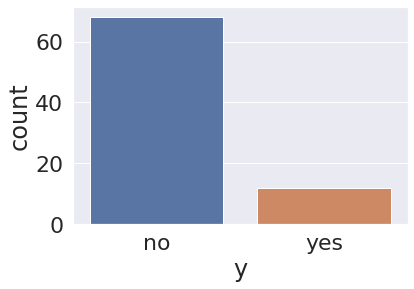

In [ ]:
sns.countplot(data=data[data.marital=='unknown'], x='y')

По графикам не наблюдается зависимости таргетов от данного признака, кроме того что ответов 'no' всегда значительно больше. Проверим значимость признака

In [ ]:
categ_depend_test('marital')

Contingency tabel
y            no   yes
marital              
divorced   4136   476
married   22396  2532
single     9948  1620
unknown      68    12
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Гипотеза H0 отклонена


Проведенный тест $\chi^2$ показал что признак 'marital' значимый

####Education##

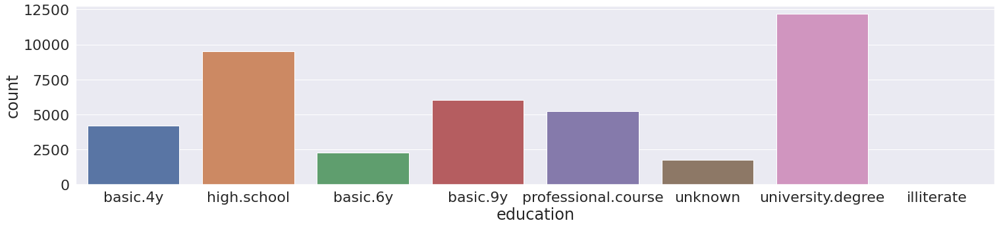

In [ ]:
plot_dist_categ('education')

Из графика следует: 

1.   большинство клиентов имеют высшее образование или закончили полное среднее 
2.   необразованных людей мало




In [ ]:
data[data.education=='illiterate'].marital.count()

18

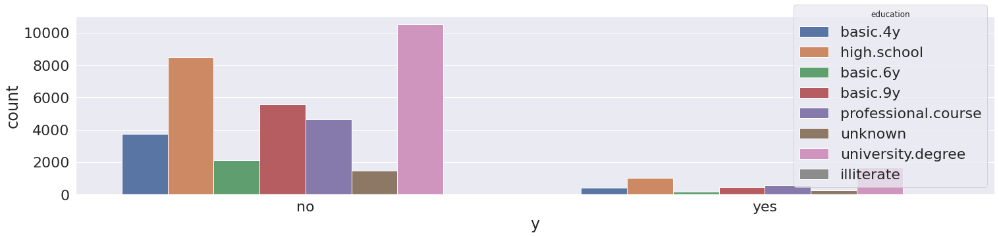

In [ ]:
plot_dist_cat_y('education')

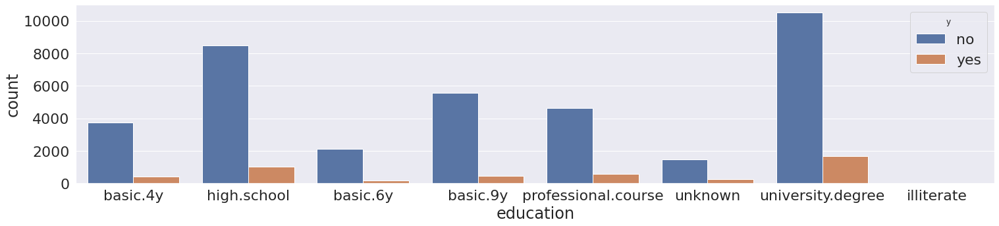

In [ ]:
plot_dist_y_cat('education')

Посмотрим отдельно на категорию 'illitearate'

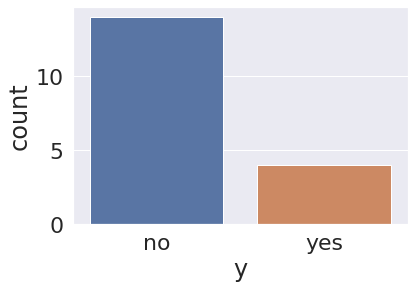

In [ ]:
sns.countplot(data=data[data.education=='illiterate'], x='y')

По графикам не наблюдается зависимости таргетов от данного признака, кроме того что ответов 'no' всегда значительно больше. Проверим значимость признака

In [ ]:
categ_depend_test('education')

Contingency tabel
y                       no   yes
education                       
basic.4y              3748   428
basic.6y              2104   188
basic.9y              5572   473
high.school           8484  1031
illiterate              14     4
professional.course   4648   595
university.degree    10498  1670
unknown               1480   251
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Гипотеза H0 отклонена


Проведенный тест $\chi^2$ показал что признак 'education' значимый

####Default (has credit in default?)##

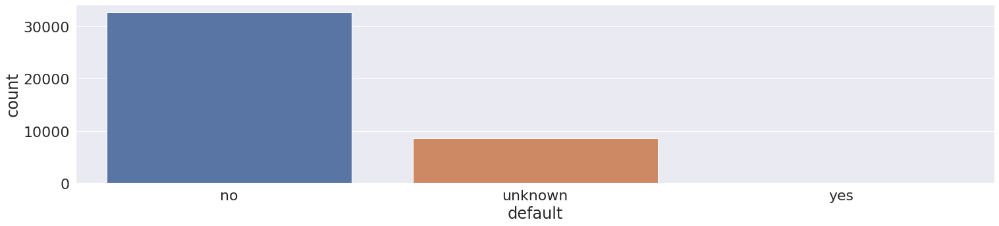

In [ ]:
plot_dist_categ('default')

Из графика следует: 

1.   большинство клиентов не имеют кредитов
2.   людей с кредитом значительно меньше чем остальных




In [ ]:
data[data.default=='yes'].marital.count()

3

Посмотрим эти 3 значения

In [ ]:
data[data.default=='yes']

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
21580,48,technician,married,professional.course,yes,no,no,cellular,aug,tue,66,1,999,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1,no
21581,48,technician,married,professional.course,yes,yes,no,cellular,aug,tue,133,1,999,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1,no
24866,31,unemployed,married,high.school,yes,no,no,cellular,nov,tue,111,2,999,1,failure,-0.1,93.200,-42.0,4.153,5195.8,no


У всех людей со значением 'yes' данного признака таргет 'no'.


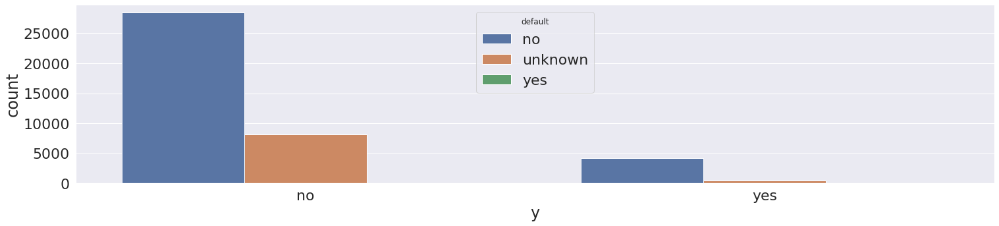

In [ ]:
plot_dist_cat_y('default')

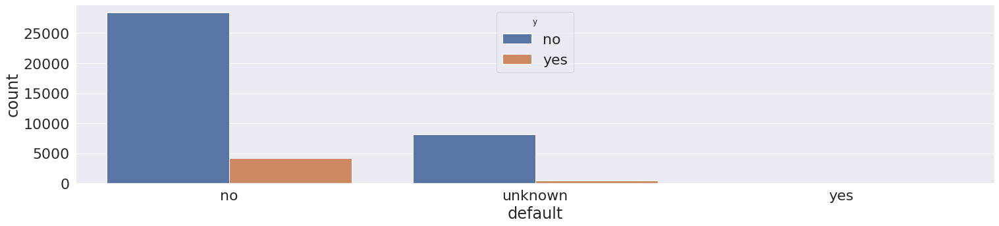

In [ ]:
plot_dist_y_cat('default')

По графикам не наблюдается зависимости таргетов от данного признака, кроме того что ответов 'no' всегда значительно больше. Также важно отметить что все элементы со значемем 'yes' имеют таргет 'no'

In [ ]:
categ_depend_test('default')

Contingency tabel
y           no   yes
default             
no       28391  4197
unknown   8154   443
yes          3     0
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Гипотеза H0 отклонена


Проведенный тест $\chi^2$ показал что признак 'default' значимый

####Housing: has housing loan?##

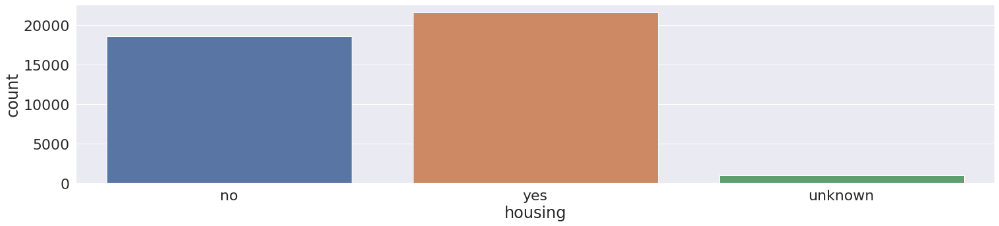

In [ ]:
plot_dist_categ('housing')

Из графика следует: 

1.   большинство клиентов имеют ипотеку





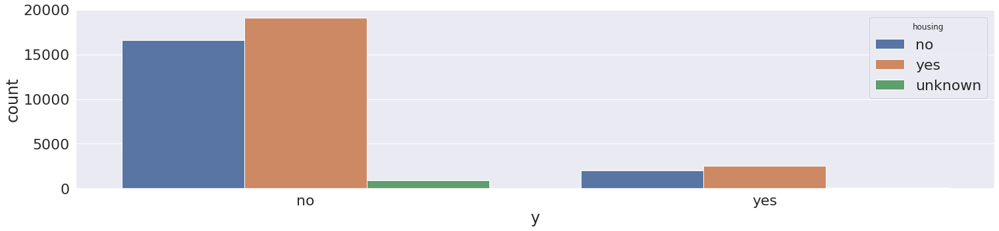

In [ ]:
plot_dist_cat_y('housing')

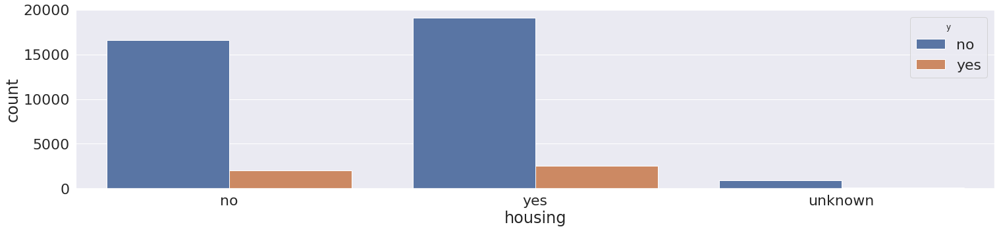

In [ ]:
plot_dist_y_cat('housing')

Посмотрим отдельно на категорию 'unknown'

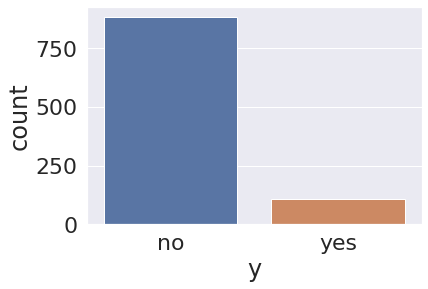

In [ ]:
sns.countplot(data=data[data.housing=='unknown'], x='y')

По графикам не наблюдается зависимости таргетов от данного признака, кроме того что ответов 'no' всегда значительно больше. Проверим значимость признака

In [ ]:
categ_depend_test('housing')

Contingency tabel
y           no   yes
housing             
no       16596  2026
unknown    883   107
yes      19069  2507
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Нельзя отвергнуть гипотезу H0


Проведенный тест $\chi^2$ показал что признак 'housing' незначимый

####Loan: has personal loan?##

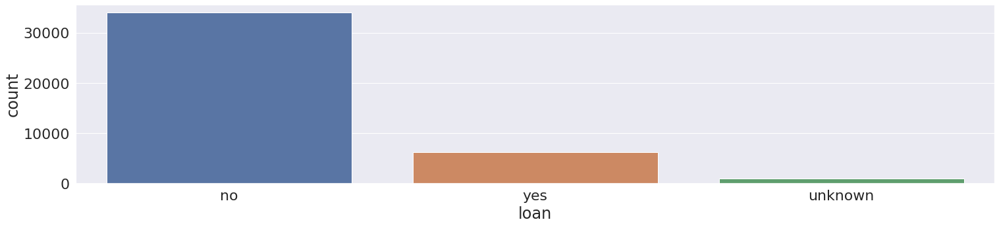

In [ ]:
plot_dist_categ('loan')

Из гистограммы следует: 

1.   большинство клиентов не имеют персонального кредита





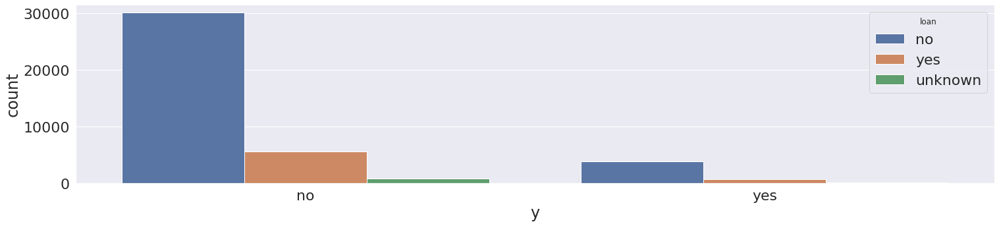

In [ ]:
plot_dist_cat_y('loan')

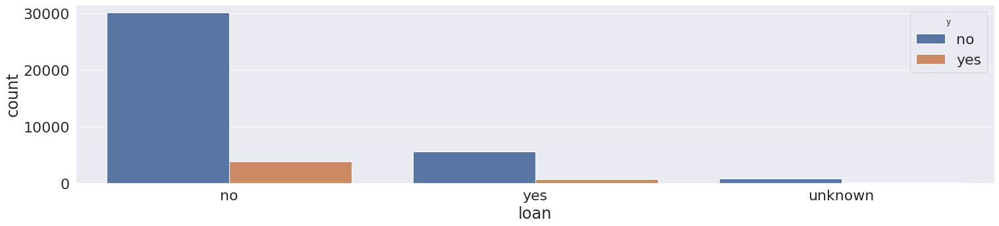

In [ ]:
plot_dist_y_cat('loan')

Посмотрим отдельно на категорию 'unknown'

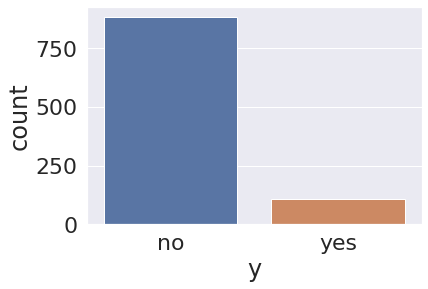

In [ ]:
sns.countplot(data=data[data.loan=='unknown'], x='y')

По графикам не наблюдается зависимости таргетов от данного признака, кроме того что ответов 'no' всегда значительно больше. Проверим значимость признака

In [ ]:
categ_depend_test('loan')

Contingency tabel
y           no   yes
loan                
no       30100  3850
unknown    883   107
yes       5565   683
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Нельзя отвергнуть гипотезу H0


Проведенный тест $\chi^2$ показал что признак 'loan' незначимый

####Сontact: contact communication type##

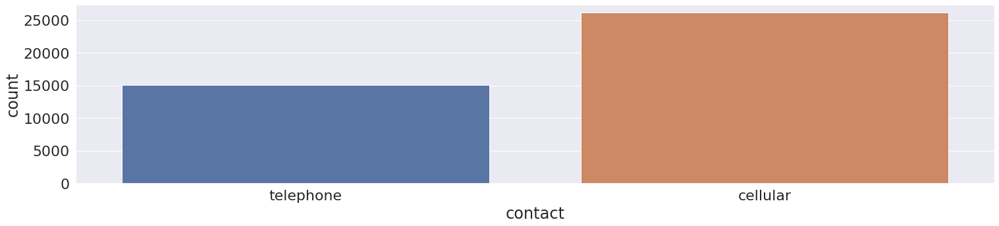

In [ ]:
plot_dist_categ('contact')

Из гистограммы следует: 

1.   чаще связываются по сотовому телефону





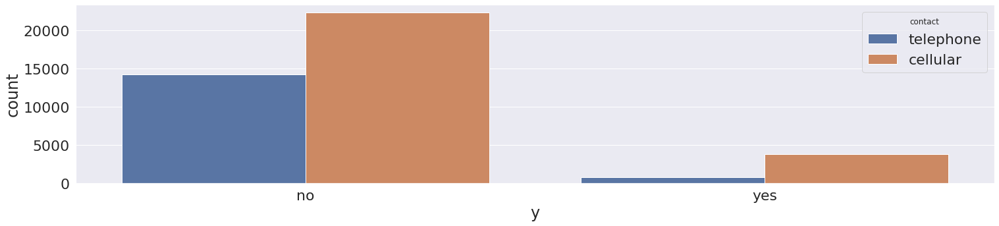

In [ ]:
plot_dist_cat_y('contact')

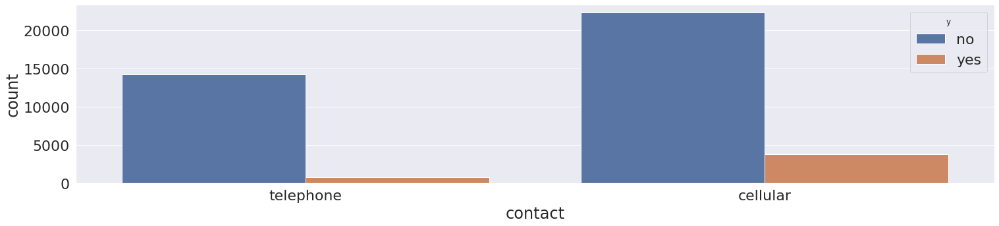

In [ ]:
plot_dist_y_cat('contact')

По графикам не наблюдается зависимости таргетов от данного признака, кроме того что ответов 'no' всегда значительно больше. Проверим значимость признака

In [ ]:
categ_depend_test('contact')

Contingency tabel
y             no   yes
contact               
cellular   22291  3853
telephone  14257   787
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Гипотеза H0 отклонена


Проведенный тест $\chi^2$ показал что признак 'contact' значимый

####Month: last contact month of year ##

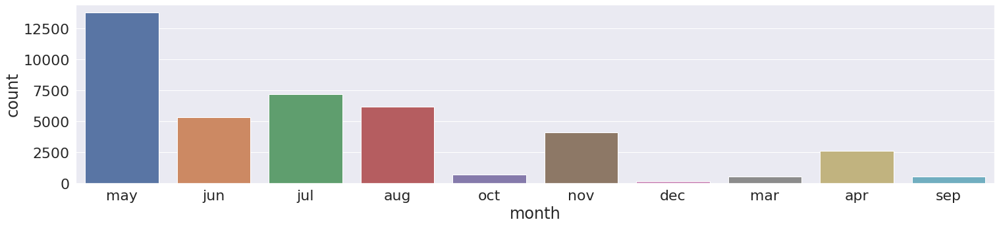

In [ ]:
plot_dist_categ('month')

Из гистограммы следует: 
1.   С большинством клиентов последний раз связывались в Мае.
2.   Меньше всего последних контактов было в декабре











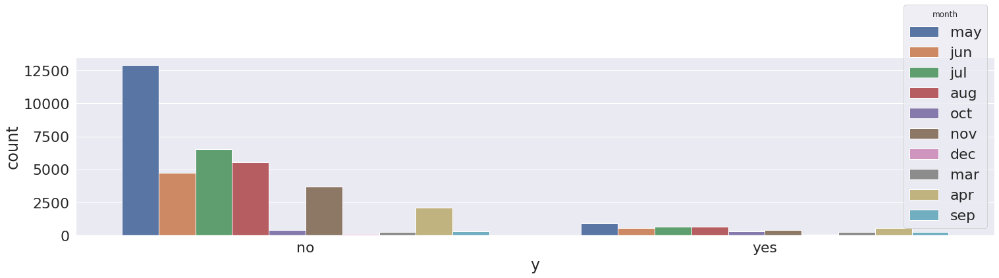

In [ ]:
plot_dist_cat_y('month')

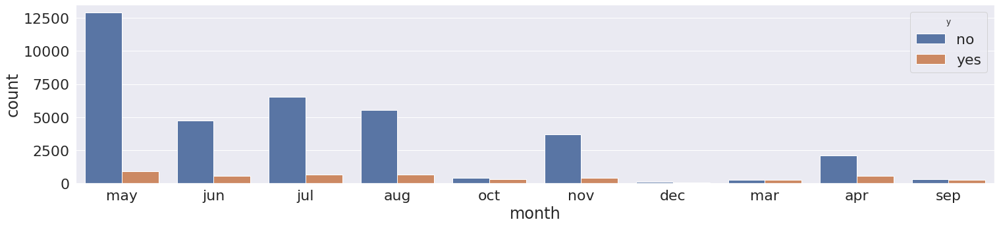

In [ ]:
plot_dist_y_cat('month')

По графикам не наблюдается зависимости таргетов от данного признака, кроме того что ответов 'no' всегда значительно больше. Также можно заметить что клиентов с разными таргетами и с которыми последний раз связывались в октябре, марте и сентябре, почти равное количество в этих месяцах.  Проверим значимость признака

In [ ]:
categ_depend_test('month')

Contingency tabel
y         no  yes
month            
apr     2093  539
aug     5523  655
dec       93   89
jul     6525  649
jun     4759  559
mar      270  276
may    12883  886
nov     3685  416
oct      403  315
sep      314  256
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Гипотеза H0 отклонена


Проведенный тест $\chi^2$ показал что признак 'month' значимый

####Day_of_week: last contact day of the week ##

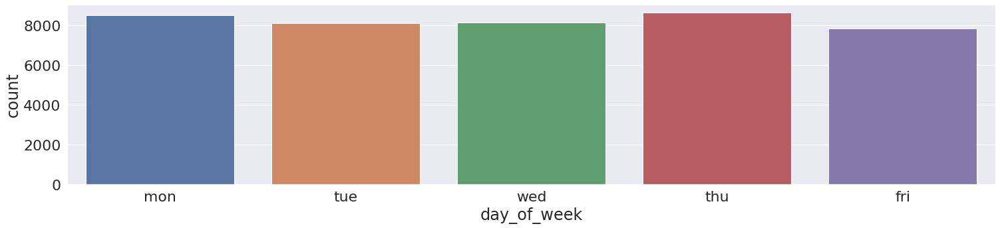

In [ ]:
plot_dist_categ('day_of_week')

In [ ]:
data.day_of_week.value_counts()

thu    8623
mon    8514
wed    8134
tue    8090
fri    7827
Name: day_of_week, dtype: int64

Из гистограммы следует: 
1.   Данные не имеют сильной зависимости от дня недели











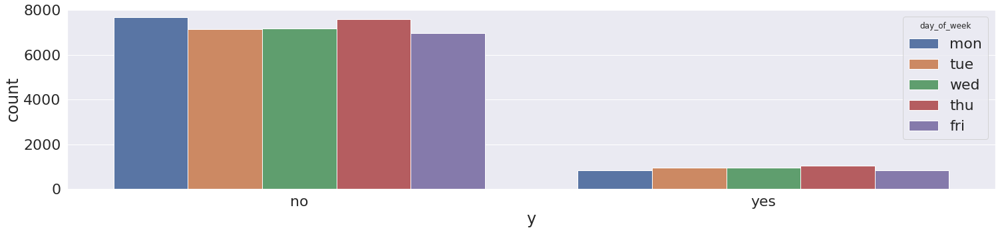

In [ ]:
plot_dist_cat_y('day_of_week')

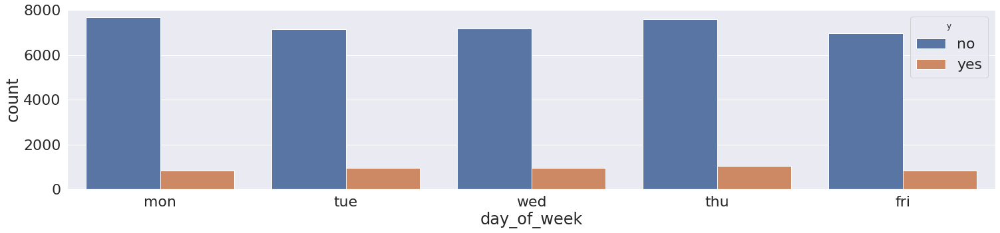

In [ ]:
plot_dist_y_cat('day_of_week')

По графикам не наблюдается зависимости таргетов от данного признака, кроме того что ответов 'no' всегда значительно больше. Проверим значимость признака

In [ ]:
categ_depend_test('day_of_week')

Contingency tabel
y              no   yes
day_of_week            
fri          6981   846
mon          7667   847
thu          7578  1045
tue          7137   953
wed          7185   949
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Гипотеза H0 отклонена


Проведенный тест $\chi^2$ показал что признак 'day_of_week' значимый

####Poutcome: outcome of the previous marketing campaign##

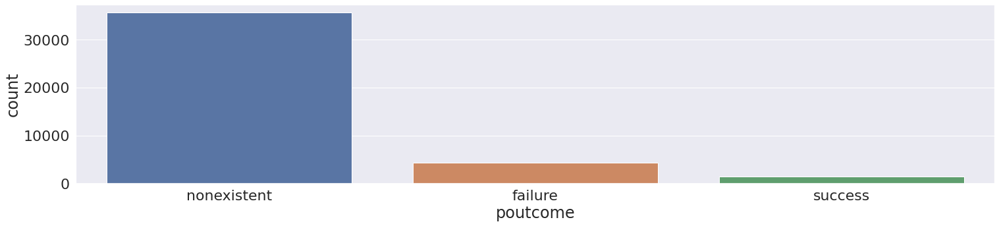

In [ ]:
plot_dist_categ('poutcome')

In [ ]:
data.poutcome.value_counts()

nonexistent    35563
failure         4252
success         1373
Name: poutcome, dtype: int64

Из графика следует: 
1.   Большинство значений nonexistent, скорее всего потому что много новых клиентов во время этой кампании
2.   Количество успешных сделок меньше чем неуспешных
3. Также видим, что количество значений 'nonexistent' равно количеству значений 0 признака 'previous'













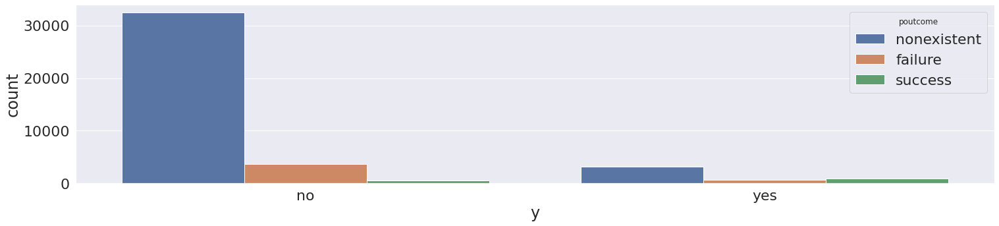

In [ ]:
plot_dist_cat_y('poutcome')

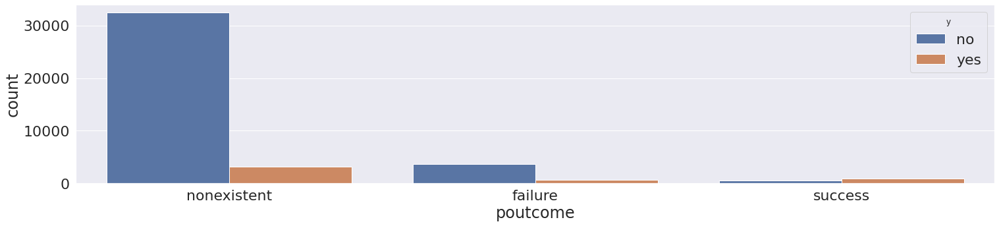

In [ ]:
plot_dist_y_cat('poutcome')

По графикам видно, что количество если сделка в последний раз была успешной, то и сейчас с большей вероятностью результат будет таким же, аналогично и для отрицательных результатов. Проверим значимость признака, но только для значений 'failure' или 'success'

In [ ]:
categ_depend_test('poutcome', data1=data[data.poutcome!='nonexistent'])

Contingency tabel
y           no  yes
poutcome           
failure   3647  605
success    479  894
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Гипотеза H0 отклонена


Проведенный тест $\chi^2$ показал что признак 'poutcome' значимый

#Multivariate analysis#

##Pairplot##

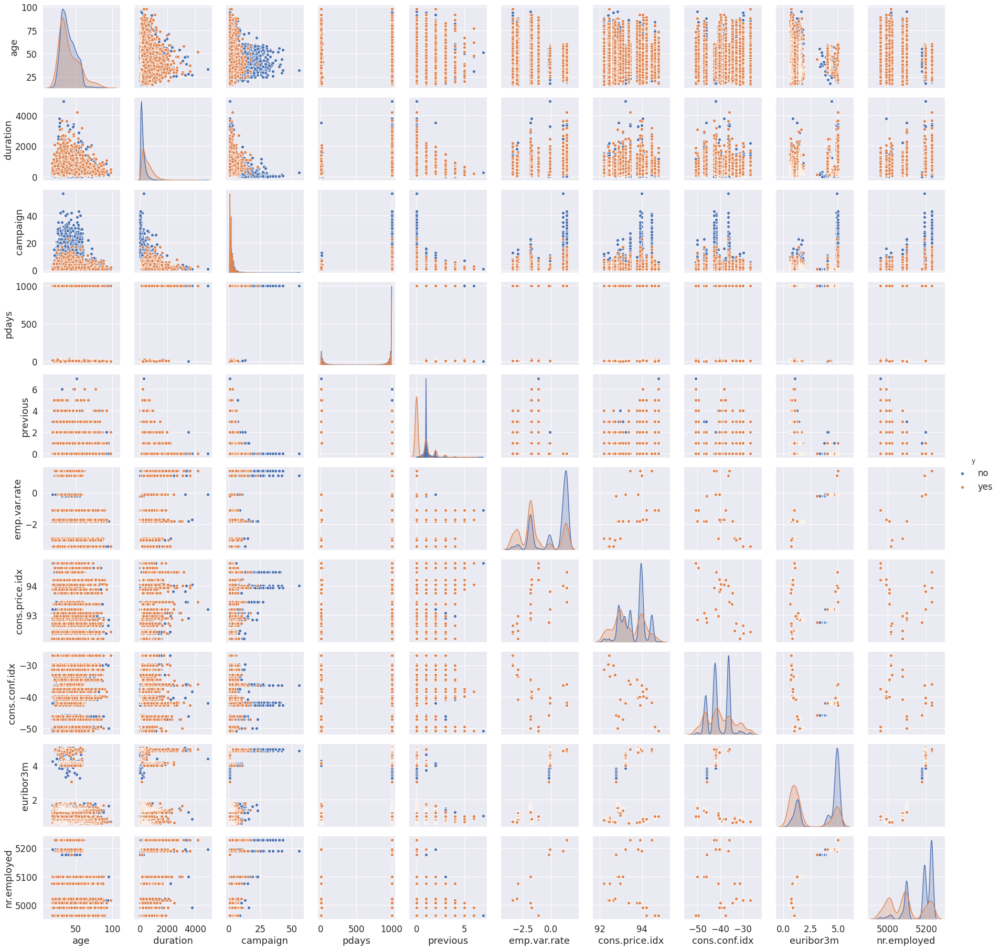

In [ ]:
sns.set(font_scale=1.5)
sns.pairplot(data=data[numeric_features + ['y']], hue='y')
plt.show()

Как видим, данные на графиках scatterplot представлены дискретно, это связано с тем что многие численные переменные дискретные. Также видно что равспределения таргетов по признакам похожи, и самое большое различие иеется по признаку 'previous' 

##Correlation matrix##

Теперь посмотрим на коэффициенты корреляции между числовыми признаками, с помощью heatmap

Начнем с коэффициентов Пирсона. Создадим heatmap который мы уже видели, когда использовали pandas_profiling

In [ ]:
corr_matrix_pearson_coef = data[numeric_features].corr()

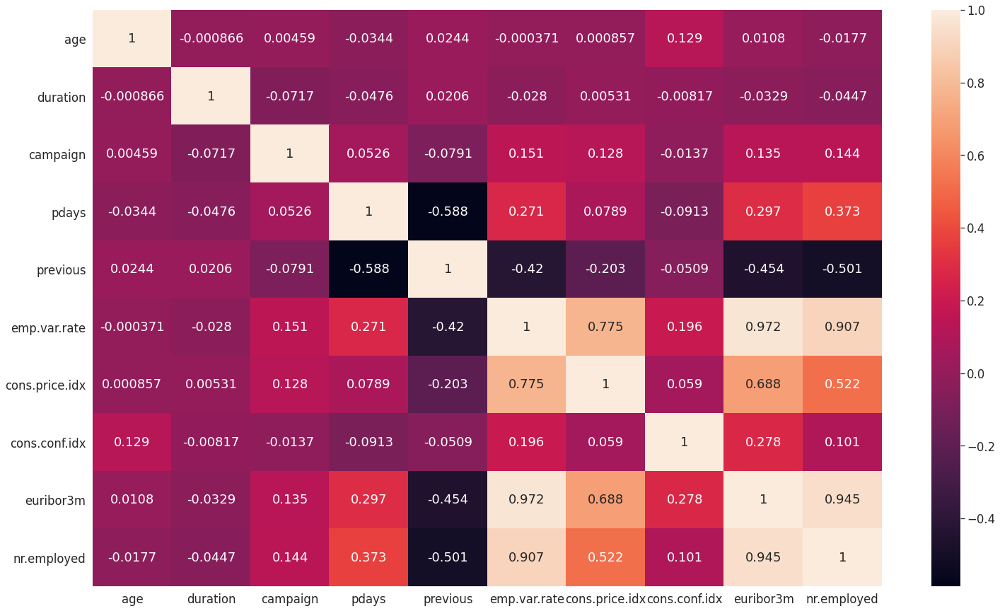

In [ ]:
plt.figure(figsize=(25, 15))
sns.heatmap(corr_matrix_pearson_coef, annot=True, fmt='.3g')
plt.show()

Видно, что имеется сильная линейная зависимость между 'emp.var.rate', 'euribor3m' и 'nr.employed'. 

Теперь посмотрим на матрицу коэффициентов Спирмана

In [ ]:
corr_matrix_spearman_coef = data[numeric_features].corr(method='spearman')

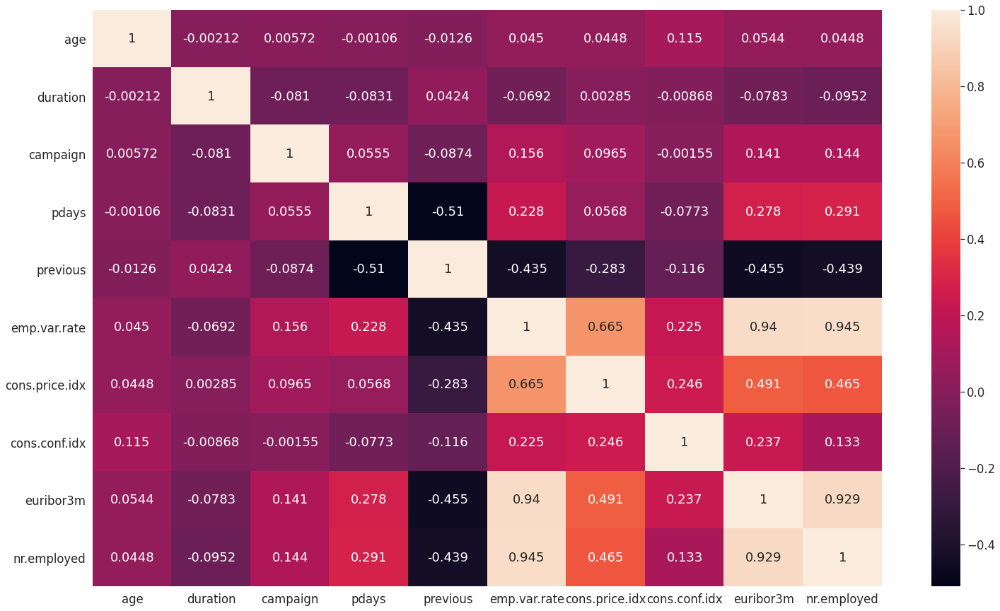

In [ ]:
plt.figure(figsize=(25, 15))
sns.heatmap(corr_matrix_spearman_coef, annot=True, fmt='.3g')
plt.show()

Видим, что здесь также имеется сильная нелинейная зависимость между переменными 'emp.var.rate', 'euribor3m' и 'nr.employed'.

Ну и на вякий случай посмотрим на матрицу корреляции Кендалла, поскольку коэффициент Кендалла позволяет определить зависимость между ранговыми переменными.

In [ ]:
corr_matrix_kendall_coef = data[numeric_features].corr(method='kendall')

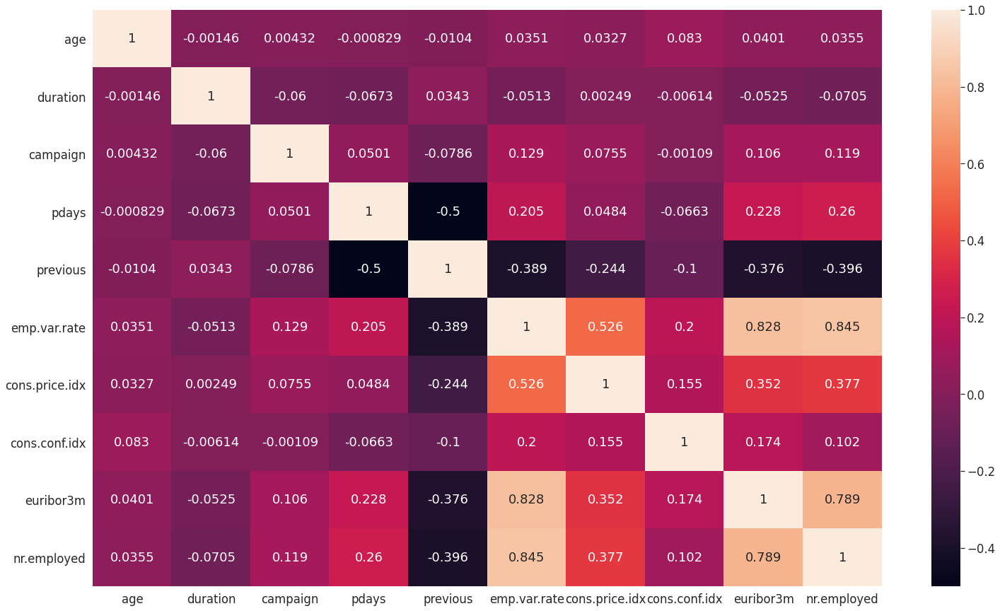

In [ ]:
plt.figure(figsize=(25, 15))
sns.heatmap(corr_matrix_kendall_coef, annot=True, fmt='.3g')
plt.show()

Получили аналогичные результаты.

##Graphics##

Теперь посмотрим на зависимости между переменныи используя различные графики

In [ ]:
def plot_facet_grid_hist(col,row,hue,feat):
  sns.set(font_scale=2)
  plt.figure(figsize=(30, 50))
  g = sns.FacetGrid(
      data,
      col=col,
      row=row,
      sharex=False,
      sharey=False,
      height=10,
      aspect=2,
      hue=hue
  )
  g = g.map(plt.hist, feat).add_legend()
  plt.show()

def plot_facet_grid_scat(col,row,feat1,feat2):
  sns.set(font_scale=4)
  plt.figure(figsize=(30, 50))
  g = sns.FacetGrid(
      data,
      col=col,
      row=row,
      sharex=False,
      sharey=False,
      height=10,
      aspect=2,
      hue='y'
  )
  g.map(plt.scatter, feat1, feat2, edgecolor="w", s=300).add_legend()
  plt.show()

In [ ]:
plot_facet_grid_hist('marital','job','y',numeric_features[0])

<Figure size 2160x3600 with 0 Axes>

Сочетание значений 'housemaid', 'services,'unemployed','sekf-employed', 'student' признака 'job' и значения 'unknown' всегда имеет таргет 'no'. Но во многом это потому что данных 'unknown' самих по себе мало

<Figure size 2160x3600 with 0 Axes>

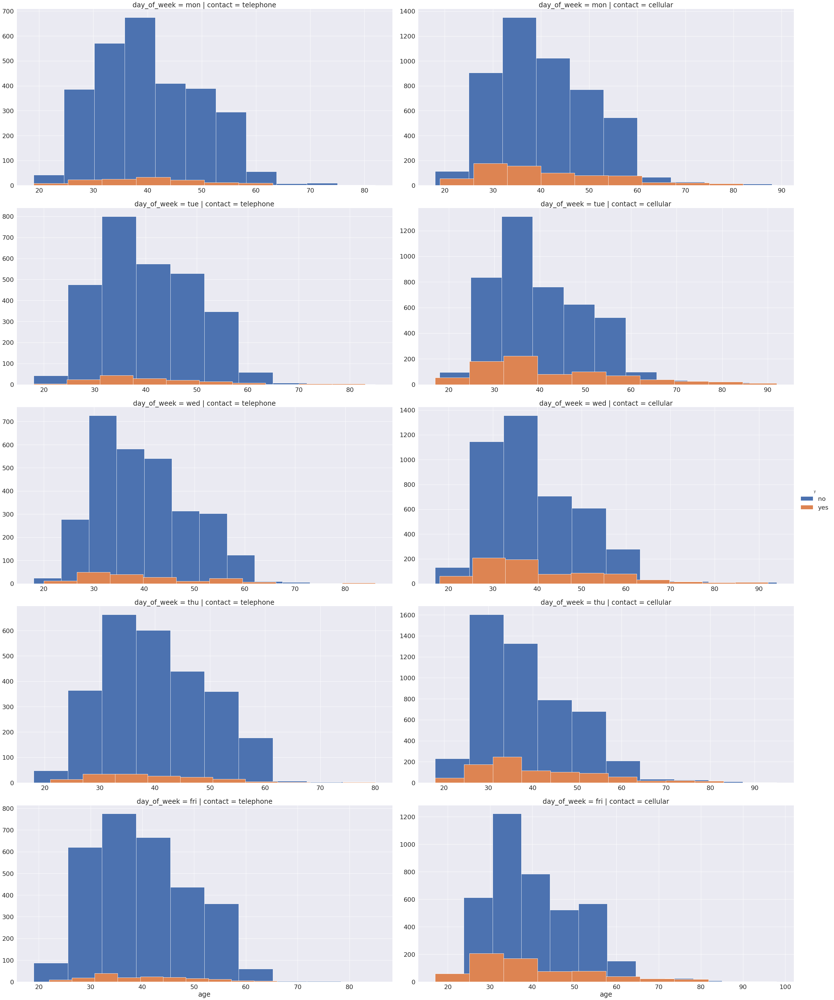

In [ ]:
plot_facet_grid_hist('contact','day_of_week','y',numeric_features[0])

Из данных графиков видно, что в целом контактов по сотовому телефону больше, независимо от дня недели

<Figure size 2160x3600 with 0 Axes>

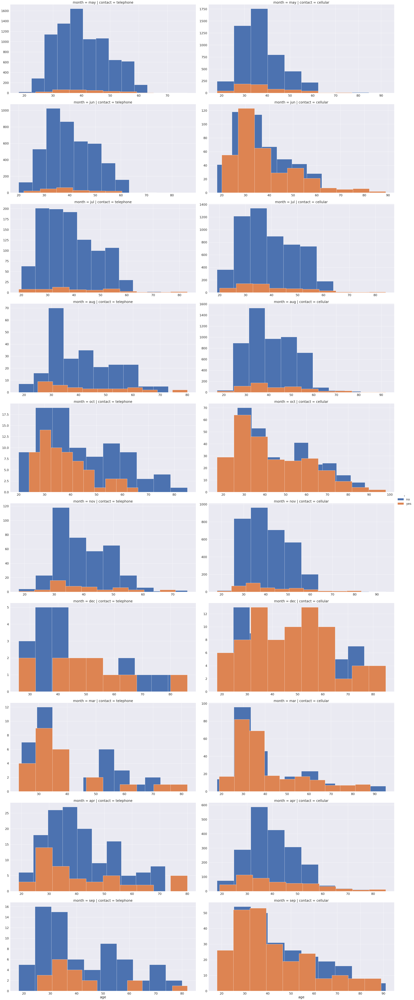

In [ ]:
plot_facet_grid_hist('contact','month','y',numeric_features[0])

Если последний звонок клиенту был соверешен по сотовому и это был июнь, октябрь, декабрь, март и сентябрь, то были равные шансы как на успех, так и неудачу. Любопытно что 4 из этих 5 месяцев являются месяцами завершающими квартал.

<Figure size 2160x3600 with 0 Axes>

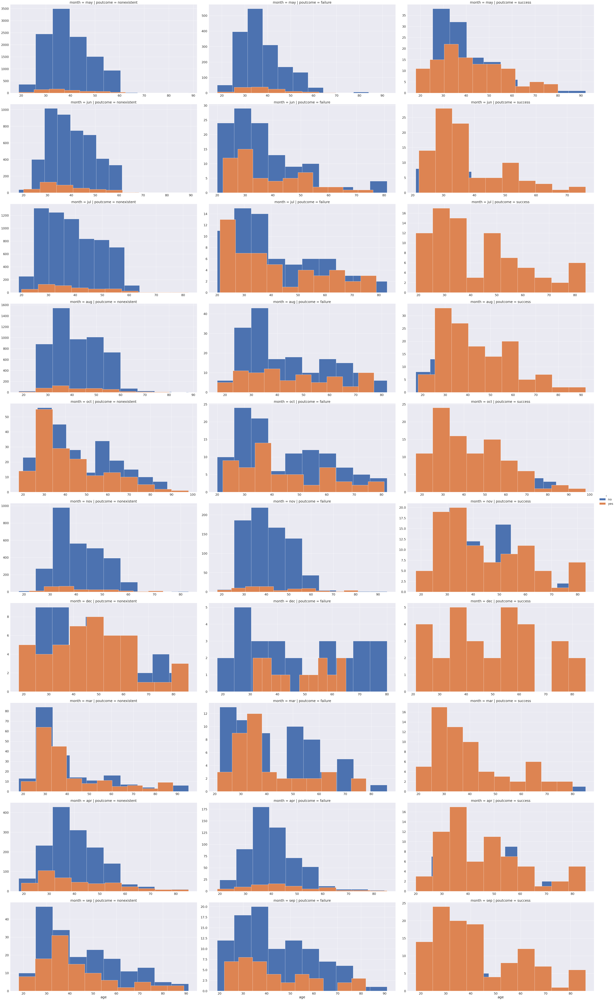

In [ ]:
plot_facet_grid_hist('poutcome','month','y',numeric_features[0])

Сделки с новыми клиентами имели больший шанс на успех, при условии что последний контакт был в октябре, декабре или марте.

##New feature##

Добавим новую переменную, обозначающую нового/старого клиента

In [ ]:
list_new_old = []
for i in range(len(data)):
  if data.iloc[i].previous!=0:
    list_new_old.append('old')
  else:
    list_new_old.append('new')
data['new/old']=pd.Series(list_new_old)

<Figure size 2160x3600 with 0 Axes>

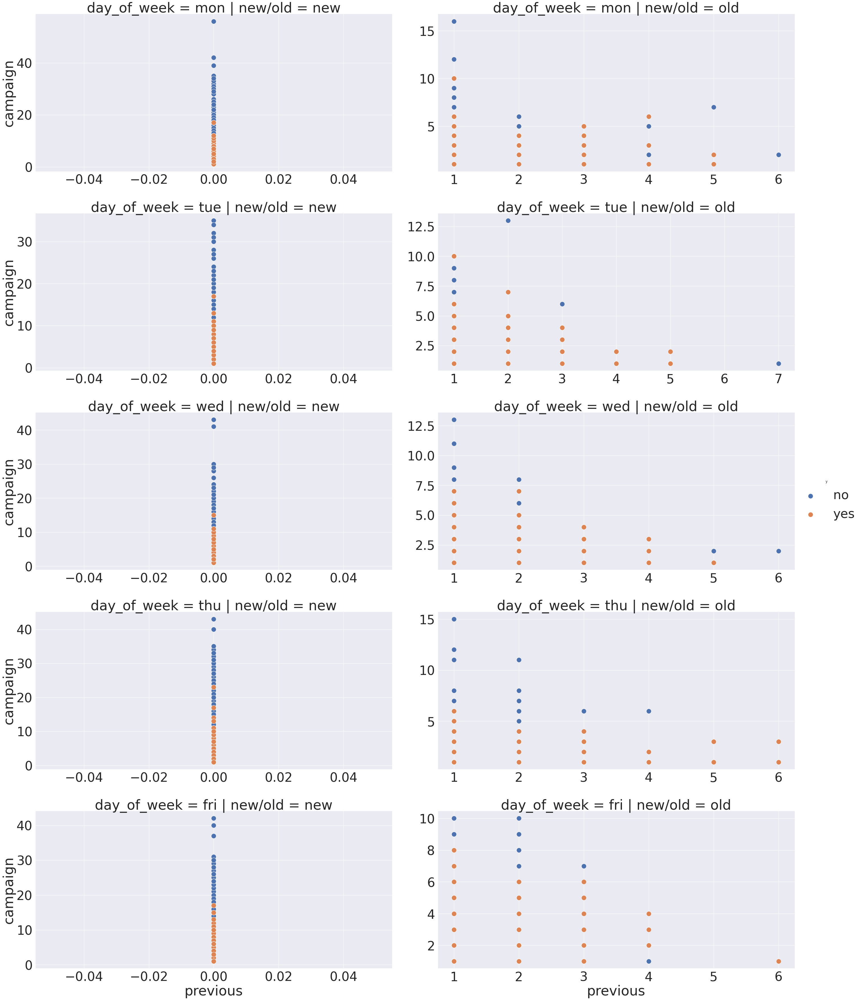

In [ ]:
plot_facet_grid_scat('new/old','day_of_week','previous','campaign')

Видим, что у вероятность успеха, при меньшем количестве звонков во время данной компании больше. Также вероятность на успех больше, если это старый клиент.

<Figure size 2160x3600 with 0 Axes>

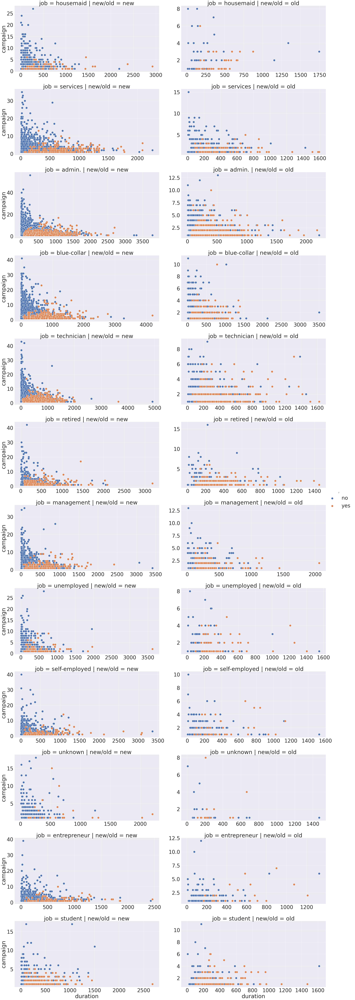

In [ ]:
plot_facet_grid_scat('new/old','job','duration','campaign')

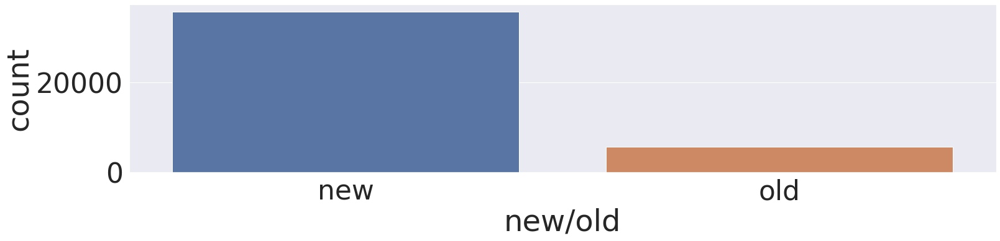

In [ ]:
plot_dist_categ('new/old')

Новых клиентов намного больше

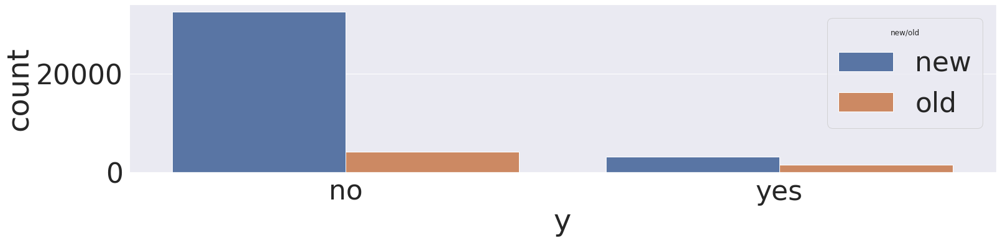

In [ ]:
plot_dist_cat_y('new/old')

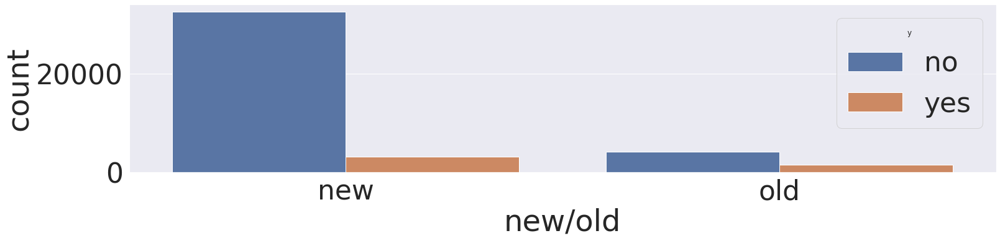

In [ ]:
plot_dist_y_cat('new/old')

In [ ]:
data[data['new/old']=='old'].y.value_counts()/data[data['new/old']=='old'].y.count()

no     0.733511
yes    0.266489
Name: y, dtype: float64

In [ ]:
data[data['new/old']=='new'].y.value_counts()/data[data['new/old']=='new'].y.count()

no     0.911678
yes    0.088322
Name: y, dtype: float64

В общем, все что было ранее сказано про старых и новых клиентов подтверждается: вероятность на успех со старым клиентом значительно больше чем с новым. Проведем тест на значимость нового признака


In [ ]:
categ_depend_test('new/old')

Contingency tabel
y           no   yes
new/old             
new      32422  3141
old       4126  1499
Гипотеза H0: переменные независимы
Гипотеза H1: пременные зависимы
Гипотеза H0 отклонена


Критерий $\chi^2$ показал что новый признак значим

In [ ]:
category_features.append('new/old')

#Data preparation




##Missing values

Проверим количество пропущенных значений

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

Как уже говорилось ранее пропусков в данных нет. Но иногда бывает, что в категориальных признаках вместо значения указан просто пробел, а мб и несколько. Но проведенный выше одномерный анализ категориальных признаков показал, что пропуски такого вида также отсутствуют

##Outliers

Во время проведения исследовательского анализа данных, было установлено что некоторые переменные не значимы для таргета, тогда мы можем сразу их убрать, чтобы не делать лишней работы по удалению выбросов. Также было выявлено что имеется зависимотсь между некоторыми пременными, поэтому оставим только одну из них. Также, зная то, что данные по таргету несбалансированны, мы должны учитывать это, и стараться удалять приблизительно равный процент выбросов из данных для обоих таргетов.

In [ ]:
data.drop(['pdays', 'housing','loan','emp.var.rate','nr.employed'], axis='columns', inplace=True)

In [ ]:
numeric_features.remove('pdays')
numeric_features.remove('emp.var.rate')
numeric_features.remove('nr.employed')
category_features.remove('housing')
category_features.remove('loan')

###Standart deviation

Проверим какие признаки распределены нормально

In [ ]:
for column in data[numeric_features]:
  check_normality(column)

Statistics=3904.888, p=0.000
Гипотеза о нормальности выборки по признаку 'age'должна быть отклонена
Statistics=30134.609, p=0.000
Гипотеза о нормальности выборки по признаку 'duration'должна быть отклонена
Statistics=40280.131, p=0.000
Гипотеза о нормальности выборки по признаку 'campaign'должна быть отклонена
Statistics=33221.476, p=0.000
Гипотеза о нормальности выборки по признаку 'previous'должна быть отклонена
Statistics=4390.489, p=0.000
Гипотеза о нормальности выборки по признаку 'cons.price.idx'должна быть отклонена
Statistics=936.374, p=0.000
Гипотеза о нормальности выборки по признаку 'cons.conf.idx'должна быть отклонена
Statistics=366981.784, p=0.000
Гипотеза о нормальности выборки по признаку 'euribor3m'должна быть отклонена


Ни один из численных признаков не распределен нормально, попробуем теперь разделить данные по таргетам и снова проверить нормальность

In [ ]:
for column in data[numeric_features]:
  check_normality_with_y(column,'no')
  check_normality_with_y(column,'yes')

Statistics=2324.997, p=0.000
Гипотеза о нормальности выборки по признаку 'age' для целевой переменной 'no' должна быть отклонена
Statistics=601.289, p=0.000
Гипотеза о нормальности выборки по признаку 'age' для целевой переменной 'yes' должна быть отклонена
Statistics=30293.783, p=0.000
Гипотеза о нормальности выборки по признаку 'duration' для целевой переменной 'no' должна быть отклонена
Statistics=1856.906, p=0.000
Гипотеза о нормальности выборки по признаку 'duration' для целевой переменной 'yes' должна быть отклонена
Statistics=35232.691, p=0.000
Гипотеза о нормальности выборки по признаку 'campaign' для целевой переменной 'no' должна быть отклонена
Statistics=3479.927, p=0.000
Гипотеза о нормальности выборки по признаку 'campaign' для целевой переменной 'yes' должна быть отклонена
Statistics=31089.599, p=0.000
Гипотеза о нормальности выборки по признаку 'previous' для целевой переменной 'no' должна быть отклонена
Statistics=2012.687, p=0.000
Гипотеза о нормальности выборки по при

Получили аналогичный результат, значит для данных признаков мы не можем использовать стандартное отклонение для удаления выбросов.

###Boxplots

Поэтому сначала разделим данные по таргету и построим для них боксплоты

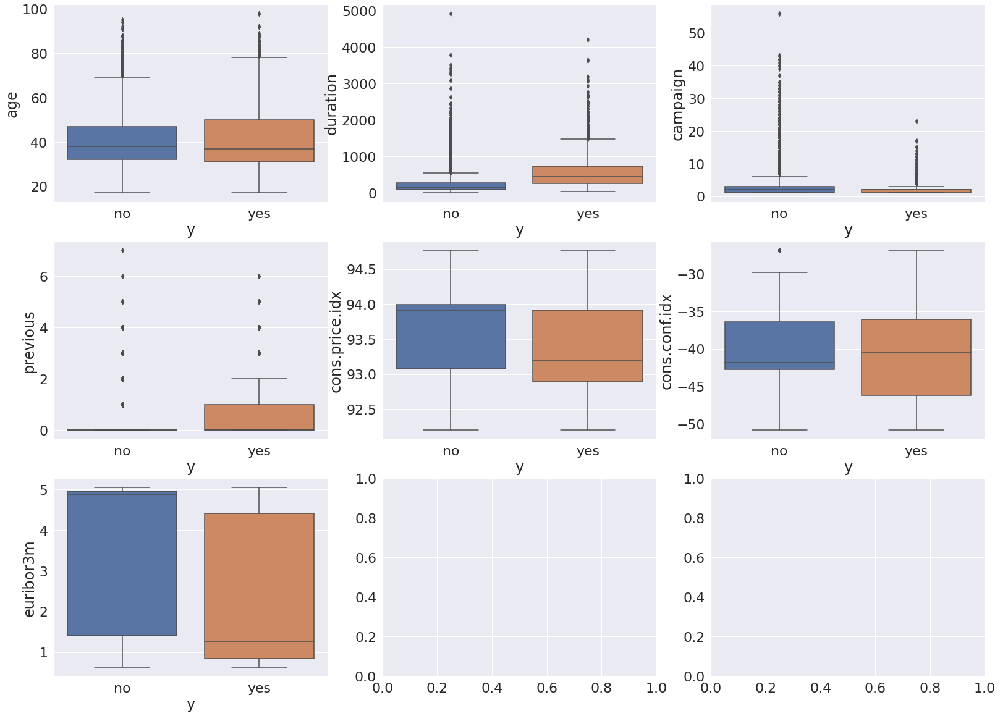

In [ ]:
data_yes = data[data.y=='yes']
data_no = data[data.y=='no']
sns.set(font_scale=2)
fig, axes = plt.subplots(3,3, figsize=(27,20))
for i in range(3):
  if i==2:
    j=0
    sns.boxplot(data=data, x='y',y=numeric_features[i*3+j], ax=axes[i,j])
  else:
    for j in range(3):
      sns.boxplot(data=data, x='y',y=numeric_features[i*3+j], ax=axes[i,j])

Судя по графикам, выбросы имеются в призаках 'age', 'duration', 'previous', 'campaign' и 'cons.conf.idx'. Попробуем удалить выбросы согласно признаку 'age' и снова построить боксплоты.

In [ ]:
def remove_outliers_box(feat, data):
  data_yes = data[data.y=='yes']
  data_no = data[data.y=='no']
  q1,q3 = data_no[feat].quantile([0.25,0.75])
  iqr = q3-q1
  left_whisker = q1-1.5*iqr
  right_whisker = q3+1.5*iqr
  filter = (data_no[feat]>=left_whisker) & (data_no[feat]<=right_whisker)
  data_changed_no = data_no[filter]
  q1,q3 = data_yes[feat].quantile([0.25,0.75])
  iqr = q3-q1
  left_whisker = q1-1.5*iqr
  right_whisker = q3+1.5*iqr
  filter = (data_yes[feat]>=left_whisker) & (data_yes[feat]<=right_whisker)
  data_changed_yes = data_yes[filter]
  data_changed = pd.concat([data_changed_no, data_changed_yes])
  return data_changed

In [ ]:
data_changed = remove_outliers_box('age', data)

Проверим какой процент данных сохранился

In [ ]:
print('Процент оставшихся данных с таргетом "no" {}'.format(len(data_changed[data_changed.y=='no'])/len(data[data.y=='no'])))
print('Процент оставшихся данных с таргетом "yes" {}'.format(len(data_changed[data_changed.y=='yes'])/len(data[data.y=='yes'])))

Процент оставшихся данных с таргетом "no" 0.9932144029769071
Процент оставшихся данных с таргетом "yes" 0.9818965517241379


Построим новые боксплоты для оставшихся данных

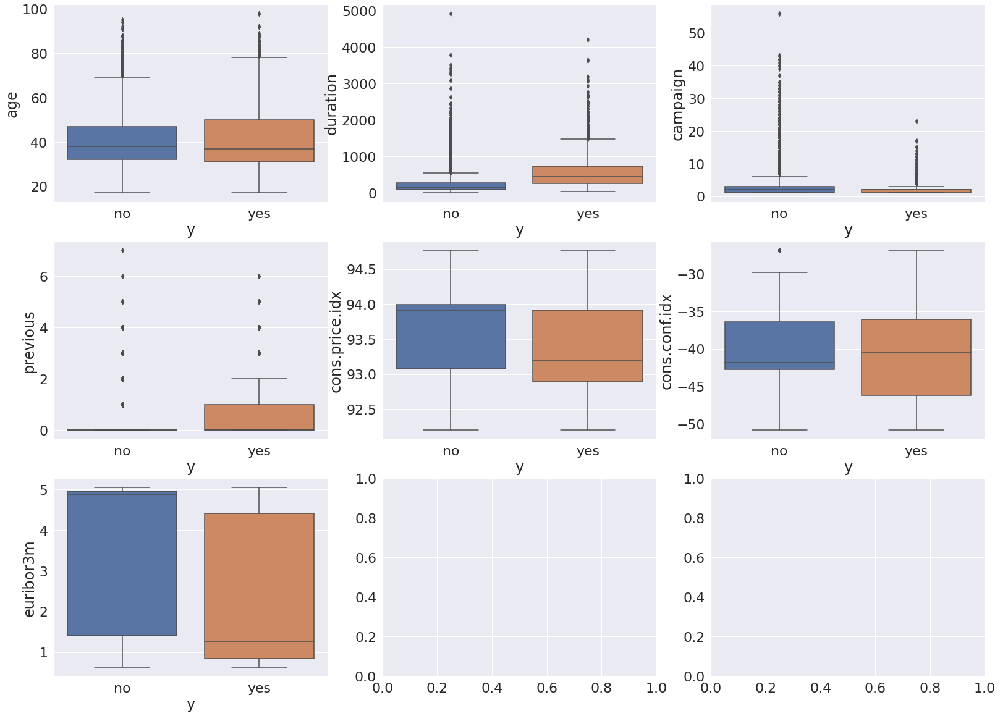

In [ ]:
fig, axes = plt.subplots(3,3, figsize=(27,20))
for i in range(3):
  if i==2:
    j=0
    sns.boxplot(data=data, x='y',y=numeric_features[i*3+j], ax=axes[i,j])
  else:
    for j in range(3):
      sns.boxplot(data=data, x='y',y=numeric_features[i*3+j], ax=axes[i,j])

Как видим, удаление выбросов для переменной 'age', не привнесло сильных изменений в остальные графики. Теперь удалим выбросы по признаку 'duration'

In [ ]:
data_changed = remove_outliers_box('duration',data_changed)
print('Процент оставшихся данных с таргетом "no" {}'.format(len(data_changed[data_changed.y=='no'])/len(data[data.y=='no'])))
print('Процент оставшихся данных с таргетом "yes" {}'.format(len(data_changed[data_changed.y=='yes'])/len(data[data.y=='yes'])))

Процент оставшихся данных с таргетом "no" 0.9338951515814818
Процент оставшихся данных с таргетом "yes" 0.9525862068965517


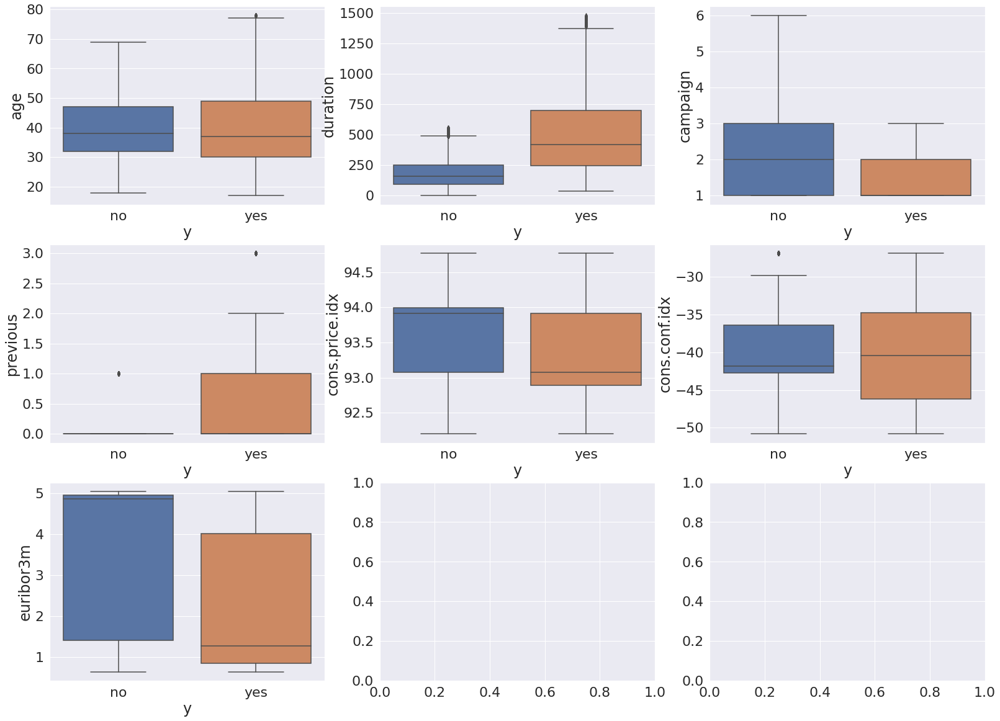

In [ ]:
fig, axes = plt.subplots(3,3, figsize=(27,20))
for i in range(3):
  if i==2:
    j=0
    sns.boxplot(data=data_changed, x='y',y=numeric_features[i*3+j], ax=axes[i,j])
  else:
    for j in range(3):
      sns.boxplot(data=data_changed, x='y',y=numeric_features[i*3+j], ax=axes[i,j])

Как видим, удаление выбросов для переменной 'duration', также не привнесло сильных изменений в остальные графики. Перейдем к признаку 'campaign'. Помним, что данный признак не совсем корректен, поскольку новые клиенты в нем не учитываются, поэтому посмотрим только на старых клиентов.

Процент оставшихся данных с таргетом "no" 0.8616340155412061
Процент оставшихся данных с таргетом "yes" 0.8278017241379311


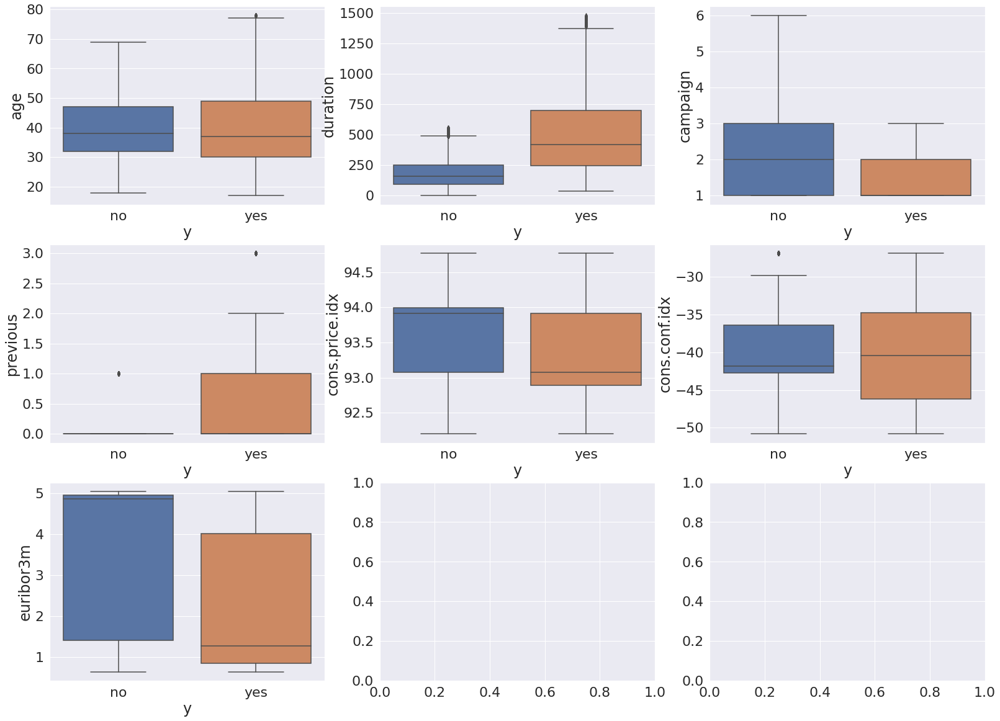

In [ ]:
data_changed = remove_outliers_box('campaign',data_changed)
print('Процент оставшихся данных с таргетом "no" {}'.format(len(data_changed[data_changed.y=='no'])/len(data[data.y=='no'])))
print('Процент оставшихся данных с таргетом "yes" {}'.format(len(data_changed[data_changed.y=='yes'])/len(data[data.y=='yes'])))
fig, axes = plt.subplots(3,3, figsize=(27,20))
for i in range(3):
  if i==2:
    j=0
    sns.boxplot(data=data_changed, x='y',y=numeric_features[i*3+j], ax=axes[i,j])
  else:
    for j in range(3):
      sns.boxplot(data=data_changed, x='y',y=numeric_features[i*3+j], ax=axes[i,j])

И снова удаление выбросов для переменной 'campaign', также не привнесло сильных изменений в остальные графики. Перейдем к признаку 'previous'. Помним, что данный признак не совсем корректен, поскольку новые клиенты в нем не учитываются, поэтому посмотрим только на старых клиентов.

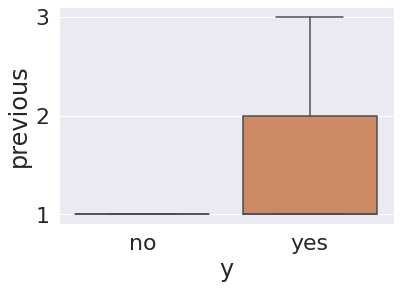

In [ ]:
sns.boxplot(data=data_changed[data_changed['new/old']=='old'], x='y',y='previous')

К сожалениею, это не дало значимых улучшений, за исключением того что правый ус боксплота теперь указывает на 1 для таргета 'no', а для таргета 'yes' на 3. Теперь почистим данные в соотвествии с полученым результатом.

In [ ]:
data_yes = data_changed[data_changed.y=='yes']
data_no = data_changed[data_changed.y=='no']
data_changed_yes = data_yes[data_yes.previous<=3]
data_changed_no = data_no[data_no.previous<=1]
data_changed = pd.concat([data_changed_no,data_changed_yes])
print('Процент оставшихся данных с таргетом "no" {}'.format(len(data_changed[data_changed.y=='no'])/len(data[data.y=='no'])))
print('Процент оставшихся данных с таргетом "yes" {}'.format(len(data_changed[data_changed.y=='yes'])/len(data[data.y=='yes'])))

Процент оставшихся данных с таргетом "no" 0.8616340155412061
Процент оставшихся данных с таргетом "yes" 0.8278017241379311


###Isolation Forest

Попробуем еще поискать выбросы с помощью алгоритма Isolation Forest, который рассматривает признаки не по отдальности а в пространстве. Также этот алгоритм позволяет отдельно изолировать аномалии и часто показывает хороший результат на различных данных.

####Scaling

Isolation Forest - это алгоритм который использует метрики. Поэтому перед его приенением нам необходимо привести данные к одной шкале. Как уже говорилось ранее данные не соответствуют нормальному распределениею, поэтому воспользуемся нормализацией признаков.

In [ ]:
norm_data = pd.DataFrame(MinMaxScaler().fit_transform(data_changed[numeric_features]),columns = numeric_features)

In [ ]:
norm_data = norm_data.join(data_changed[category_features])

####Isolation Forest

In [ ]:
norm_data_no = norm_data[norm_data.y=='no']
norm_data_yes = norm_data[norm_data.y=='yes']

In [ ]:
clf = IsolationForest(max_samples=2000, random_state = 1, contamination= 'auto')
preds = clf.fit_predict(norm_data_no[numeric_features])
norm_data_no['anomaly'] = pd.Series(preds,index=norm_data_no.index)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
clf = IsolationForest(max_samples=2000, random_state = 1, contamination= 'auto')
preds = clf.fit_predict(norm_data_yes[numeric_features])
norm_data_yes['anomaly'] = pd.Series(preds,index=norm_data_yes.index)

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_iforest.py:281: UserWarning: max_samples (2000) is greater than the total number of samples (1819). max_samples will be set to n_samples for estimation.
  % (self.max_samples, n_samples))
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
norm_data = pd.concat([norm_data_no,norm_data_yes])

Визуализируем полученные данные

In [ ]:
pca = PCA(n_components=2)
new_data = pd.DataFrame(pca.fit_transform(norm_data[numeric_features]),index=norm_data.index)

In [ ]:
new_data['anomaly'] = norm_data.anomaly.apply(lambda i : 'no_outlier' if i == 1 else 'outlier')
new_data.columns = ['PCA_1', 'PCA_2', 'anomaly']

In [ ]:
new_data['anomaly'].value_counts()

no_outlier    24925
outlier        5677
Name: anomaly, dtype: int64

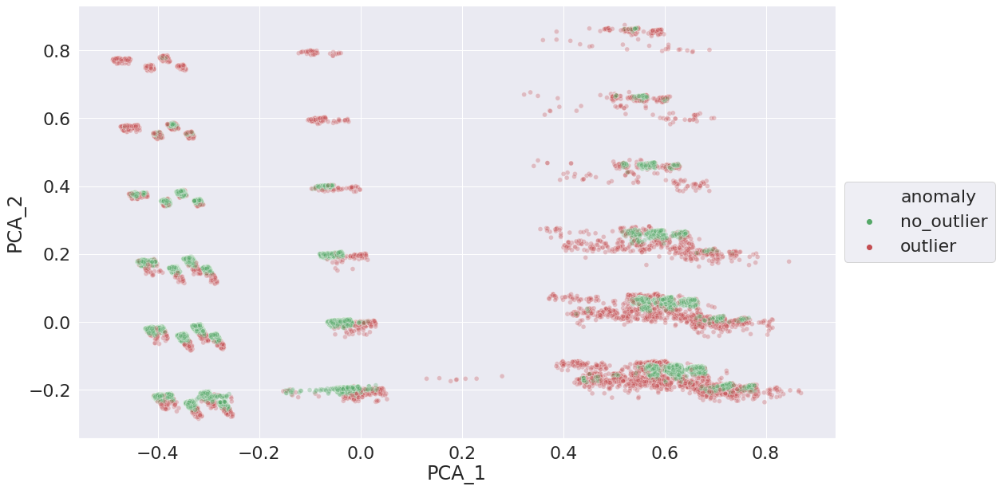

In [ ]:
plt.figure(figsize=(17,10))
g = sns.scatterplot(x='PCA_1',y='PCA_2',hue='anomaly',data=new_data,palette=['g','r'],alpha=0.3)
g.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.show()

Посчитаем, какой процент изначальных данных остался

In [ ]:
len(new_data[new_data.anomaly=='no_outlier'])/len(data)

0.6051519860153443

Видим, что осталось все 60% от изначальных данных, то есть 40% данных были удалены, это очень много, поэтому решено оставить те данные которые были получены после анализа боксплотов

##Prepare categorical data

Алгоритмы которые мы собираемся дальше использовать основаны на метриках, поэтому необходимо нормализовать данные (нормализация выбрана из-за того что данные не подчинены нормальному распределению) 

In [ ]:
data_changed

,age,job,marital,education,default,contact,month,day_of_week,duration,campaign,previous,poutcome,cons.price.idx,cons.conf.idx,euribor3m,y,new/old
0,56,housemaid,married,basic.4y,no,telephone,may,mon,261,1,0,nonexistent,93.994,-36.4,4.857,no,new
1,57,services,married,high.school,unknown,telephone,may,mon,149,1,0,nonexistent,93.994,-36.4,4.857,no,new
2,37,services,married,high.school,no,telephone,may,mon,226,1,0,nonexistent,93.994,-36.4,4.857,no,new
3,40,admin.,married,basic.6y,no,telephone,may,mon,151,1,0,nonexistent,93.994,-36.4,4.857,no,new
4,56,services,married,high.school,no,telephone,may,mon,307,1,0,nonexistent,93.994,-36.4,4.857,no,new
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41173,62,retired,married,university.degree,no,cellular,nov,thu,329,1,2,failure,94.767,-50.8,1.031,yes,old
41178,62,retired,married,university.degree,no,cellular,nov,thu,483,2,3,success,94.767,-50.8,1.031,yes,old
41181,37,admin.,married,university.degree,no,cellular,nov,fri,281,1,0,nonexistent,94.767,-50.8,1.028,yes,new
41183,73,retired,married,professional.course,no,cellular,nov,fri,334,1,0,nonexistent,94.767,-50.8,1.028,yes,new


In [ ]:
norm_data = pd.DataFrame(MinMaxScaler().fit_transform(data_changed[numeric_features]),columns = numeric_features,index=data_changed.index)
norm_data = norm_data.join(data_changed[category_features])

In [ ]:
target = norm_data.y
category_features=category_features[:-2]
category_features.append('new/old')

Категориальные данные в датасете не ранжированы, а покольку будущие алгоритмы, которые мы будем использовать, основаны на метриках, то самым удачным вариантом будет применить метод OneHotEncoding

In [ ]:
one_hot_encoder = OneHotEncoder()
categorials_data_one_hot_encoded = one_hot_encoder.fit_transform(norm_data[category_features])
categorials_data_hot_encoded = pd.DataFrame(
    categorials_data_one_hot_encoded .todense(),
    columns=one_hot_encoder.get_feature_names(),
    index=norm_data.index
)
categorials_data_hot_encoded

,x0_admin.,x0_blue-collar,x0_entrepreneur,x0_housemaid,x0_management,x0_retired,x0_self-employed,x0_services,x0_student,x0_technician,x0_unemployed,x0_unknown,x1_divorced,x1_married,x1_single,x1_unknown,x2_basic.4y,x2_basic.6y,x2_basic.9y,x2_high.school,x2_illiterate,x2_professional.course,x2_university.degree,x2_unknown,x3_no,x3_unknown,x3_yes,x4_cellular,x4_telephone,x5_apr,x5_aug,x5_dec,x5_jul,x5_jun,x5_mar,x5_may,x5_nov,x5_oct,x5_sep,x6_fri,x6_mon,x6_thu,x6_tue,x6_wed,x7_failure,x7_nonexistent,x7_success,x8_new,x8_old
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41173,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
41178,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
41181,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
41183,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [ ]:
new_data = norm_data[numeric_features].join(categorials_data_hot_encoded)

In [ ]:
new_data

,age,duration,campaign,previous,cons.price.idx,cons.conf.idx,euribor3m,x0_admin.,x0_blue-collar,x0_entrepreneur,x0_housemaid,x0_management,x0_retired,x0_self-employed,x0_services,x0_student,x0_technician,x0_unemployed,x0_unknown,x1_divorced,x1_married,x1_single,x1_unknown,x2_basic.4y,x2_basic.6y,x2_basic.9y,x2_high.school,x2_illiterate,x2_professional.course,x2_university.degree,x2_unknown,x3_no,x3_unknown,x3_yes,x4_cellular,x4_telephone,x5_apr,x5_aug,x5_dec,x5_jul,x5_jun,x5_mar,x5_may,x5_nov,x5_oct,x5_sep,x6_fri,x6_mon,x6_thu,x6_tue,x6_wed,x7_failure,x7_nonexistent,x7_success,x8_new,x8_old
0,0.639344,0.176351,0.0,0.000000,0.698753,0.60251,0.957379,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.655738,0.100676,0.0,0.000000,0.698753,0.60251,0.957379,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.327869,0.152703,0.0,0.000000,0.698753,0.60251,0.957379,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,0.377049,0.102027,0.0,0.000000,0.698753,0.60251,0.957379,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,0.639344,0.207432,0.0,0.000000,0.698753,0.60251,0.957379,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41173,0.737705,0.222297,0.0,0.666667,1.000000,0.00000,0.090002,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
41178,0.737705,0.326351,0.2,1.000000,1.000000,0.00000,0.090002,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
41181,0.327869,0.189865,0.0,0.000000,1.000000,0.00000,0.089322,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
41183,0.918033,0.225676,0.0,0.000000,1.000000,0.00000,0.089322,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


#Dimensionality reduction

##PCA

In [ ]:
pca = PCA(n_components=2)
pca_2_data = pd.DataFrame(pca.fit_transform(new_data),index=new_data.index)

In [ ]:
pca_2_data["target"] = target

In [ ]:
pca_2_data.columns = ['pca_x','pca_y','target']

###Visualising

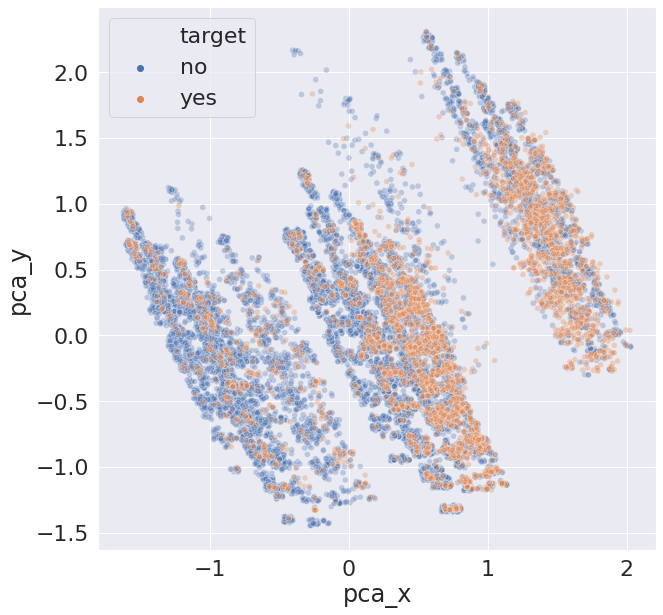

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(10,10))
sns.scatterplot(
    x='pca_x',
    y='pca_y',
    hue='target',
    data=pca_2_data,
    alpha=0.3
    )
plt.show()

PCA разделяет данные, и наблюдается линейная зависимость в новом пространстве

###Explained varience

In [ ]:
print('Объясняемая дисперсия равна {}'.format(pca.explained_variance_ratio_.sum()))

Объясняемая дисперсия равна 0.21773209741801974


###Choice number of components

In [ ]:
pca = PCA(n_components=len(new_data.columns)-1).fit(new_data)
len(pca.explained_variance_ratio_)

55

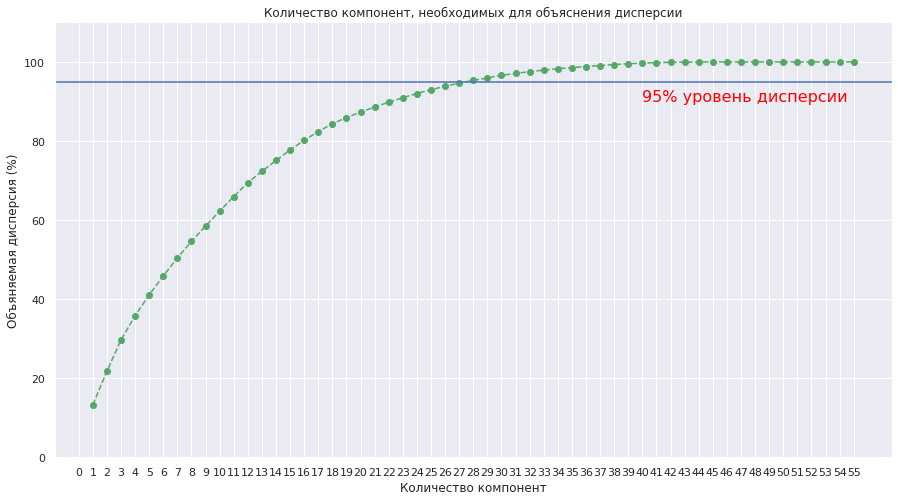

In [ ]:
sns.set(font_scale=1)
number_of_all_components = len(new_data.columns)

fig, ax = plt.subplots(figsize=(15, 8))
xrange = np.arange(1, number_of_all_components, step=1)
yrange = np.cumsum(pca.explained_variance_ratio_[:len(new_data.columns)]*100)
plt.ylim(0.0,110)
plt.plot(xrange, yrange, marker='o', linestyle='--', color='g')
plt.xlabel('Количество компонент')
plt.xticks(np.arange(0, number_of_all_components, step=1))
plt.ylabel('Объяняемая дисперсия (%)')
plt.title('Количество компонент, необходимых для объяснения дисперсии')

plt.axhline(y=95, color='b', linestyle='-')
plt.text(40, 90, '95% уровень дисперсии', color = 'red', fontsize=16)

ax.grid(axis='x',color='w')
plt.show()

График показывает, что для достижения 95%-ого уровня объйсняемой дисперсии, необходимо задействовать 27 компонент

##SVD

In [ ]:
svd = TruncatedSVD(n_components=2)
svd_2_data = pd.DataFrame(svd.fit_transform(new_data),index=new_data.index)

In [ ]:
svd_2_data["target"] = target

In [ ]:
svd_2_data.columns = ['svd_x','svd_y','target']

###Visualising

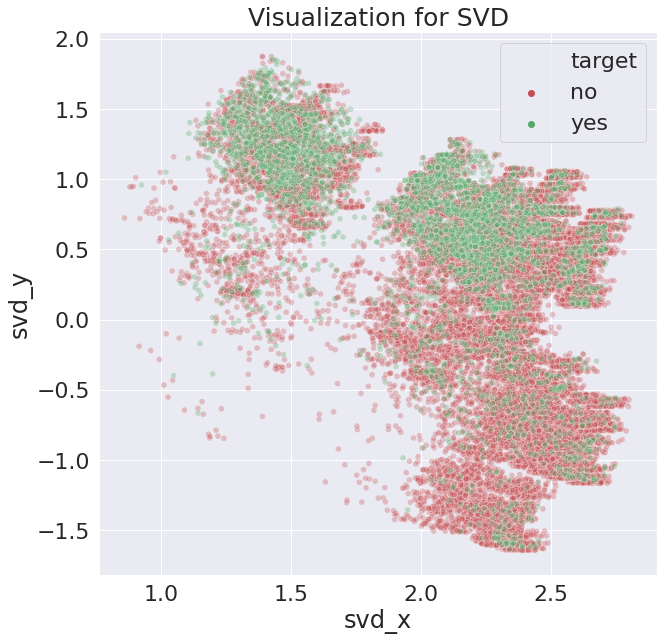

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(10,10))
sns.scatterplot(
    x='svd_x',
    y='svd_y',
    hue='target',
    data=svd_2_data,
    alpha=0.3,
    palette=['r','g']
    )
plt.title('Visualization for SVD',fontdict={'fontsize':25})
plt.show()

Метод SVD показал, что существует способ деления данных на 2 класса (не сооветсвующих таргету).

###Explained varience

In [ ]:
print('Объясняемая дисперсия равна {}'.format(svd.explained_variance_ratio_.sum()))

Объясняемая дисперсия равна 0.15142497830359467


###Choice number of components

In [ ]:
svd = TruncatedSVD(n_components=len(new_data.columns)-1).fit(new_data)
len(pca.explained_variance_ratio_)

55

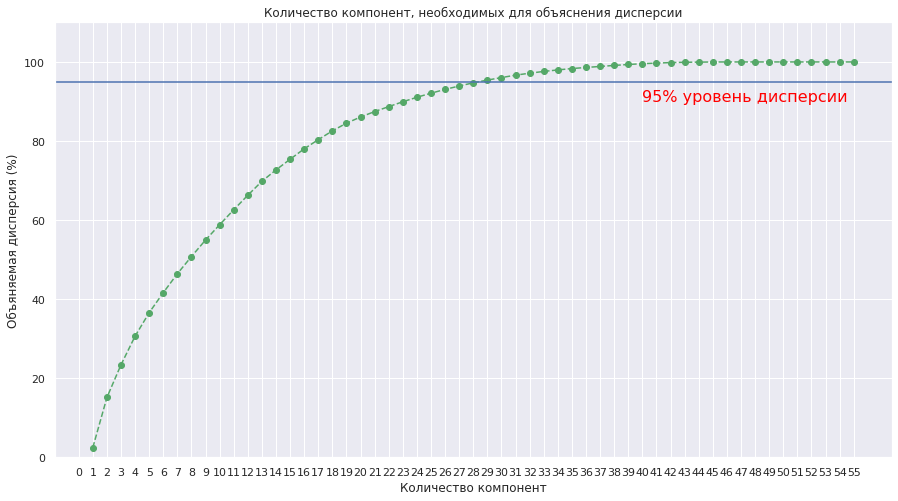

In [ ]:
sns.set(font_scale=1)
number_of_all_components = len(new_data.columns)

fig, ax = plt.subplots(figsize=(15, 8))
xrange = np.arange(1, number_of_all_components, step=1)
yrange = np.cumsum(svd.explained_variance_ratio_[:len(new_data.columns)]*100)
plt.ylim(0.0,110)
plt.plot(xrange, yrange, marker='o', linestyle='--', color='g')
plt.xlabel('Количество компонент')
plt.xticks(np.arange(0, number_of_all_components, step=1))
plt.ylabel('Объяняемая дисперсия (%)')
plt.title('Количество компонент, необходимых для объяснения дисперсии')

plt.axhline(y=95, color='b', linestyle='-')
plt.text(40, 90, '95% уровень дисперсии', color = 'red', fontsize=16)

ax.grid(axis='x',color='w')
plt.show()

График показывает, что для достижения 95%-ого уровня объйсняемой дисперсии, необходимо задействовать 29 компонент

##UMAP

In [ ]:
umap_ = umap.UMAP(n_neighbors=5, min_dist=0.3, metric='manhattan',n_components=2).fit_transform(new_data)
umap_2_data = pd.DataFrame(umap_,index=new_data.index)
umap_2_data["target"] = target
umap_2_data.columns = ['umap_x','umap_y','target']

###Visualising

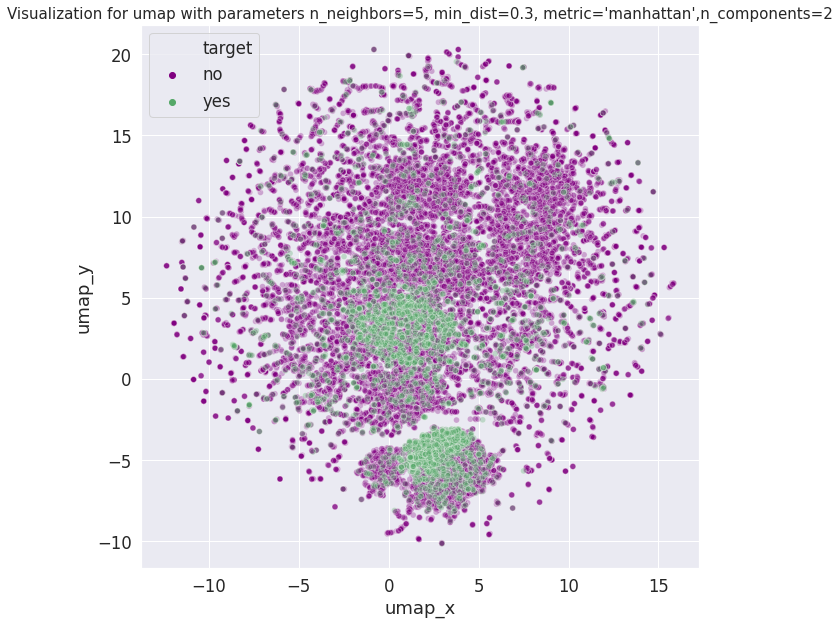

In [ ]:
sns.set(font_scale=1.5)
plt.figure(figsize=(10,10))
plt.title('Visualization for umap with parameters n_neighbors=5, min_dist=0.3, metric=\'manhattan\',n_components=2',fontdict={'fontsize':15})
sns.scatterplot(
    x='umap_x',
    y='umap_y',
    hue='target',
    data=umap_2_data,
    alpha=0.3,
    palette=['purple','g']
    )
plt.show()

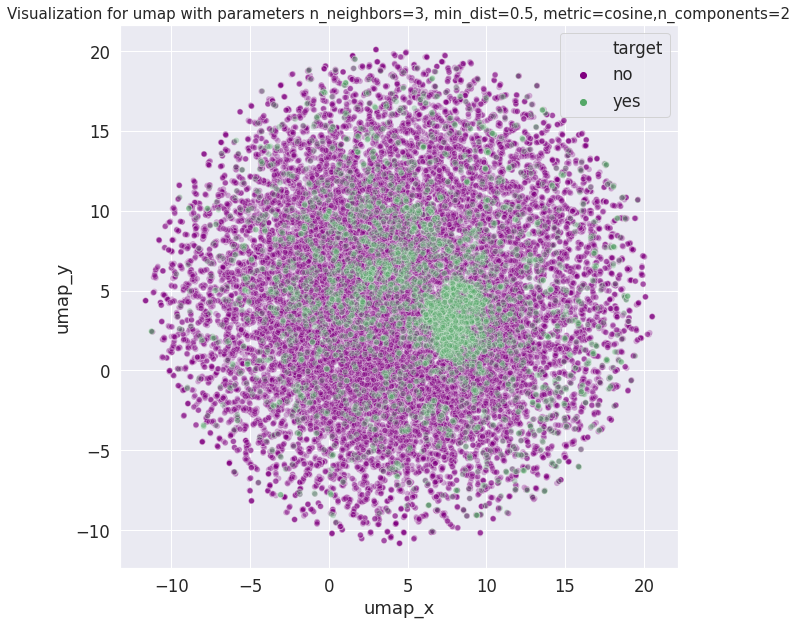

In [ ]:
min_dist=0.5
n_neighbors=3
metric='cosine'
n_components=2
umap_ = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric,n_components=2).fit_transform(new_data)
umap_2_data = pd.DataFrame(umap_,index=new_data.index)
umap_2_data["target"] = target
umap_2_data.columns = ['umap_x','umap_y','target']
sns.set(font_scale=1.5)
plt.figure(figsize=(10,10))
plt.title('Visualization for umap with parameters n_neighbors={}, min_dist={}, metric={},n_components={}'.format(n_neighbors,min_dist,metric,n_components),fontdict={'fontsize':15})
sns.scatterplot(
    x='umap_x',
    y='umap_y',
    hue='target',
    data=umap_2_data,
    alpha=0.3,
    palette=['purple','g']
    )
plt.show()

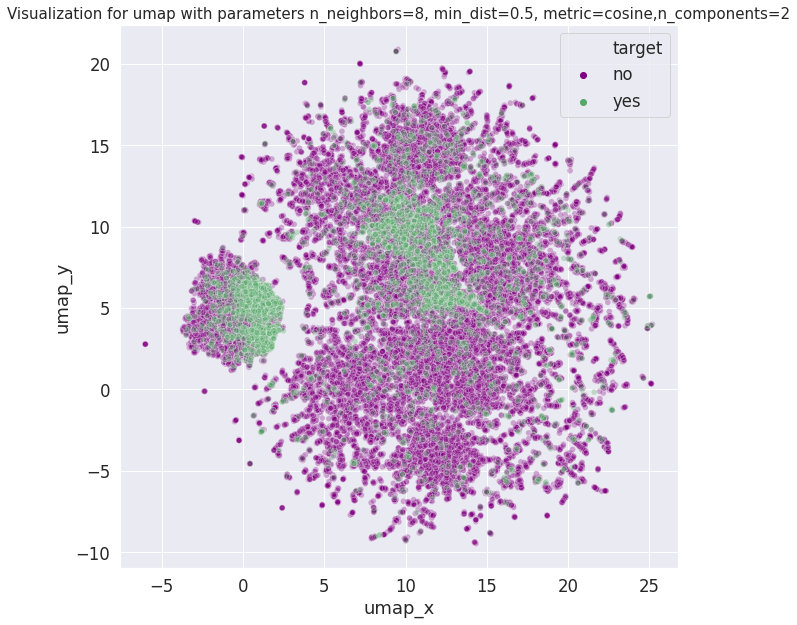

In [ ]:
min_dist=0.5
n_neighbors=8
metric='cosine'
n_components=2
umap_ = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric,n_components=2).fit_transform(new_data)
umap_2_data = pd.DataFrame(umap_,index=new_data.index)
umap_2_data["target"] = target
umap_2_data.columns = ['umap_x','umap_y','target']
sns.set(font_scale=1.5)
plt.figure(figsize=(10,10))
plt.title('Visualization for umap with parameters n_neighbors={}, min_dist={}, metric={},n_components={}'.format(n_neighbors,min_dist,metric,n_components),fontdict={'fontsize':15})
sns.scatterplot(
    x='umap_x',
    y='umap_y',
    hue='target',
    data=umap_2_data,
    alpha=0.3,
    palette=['purple','g']
    )
plt.show()

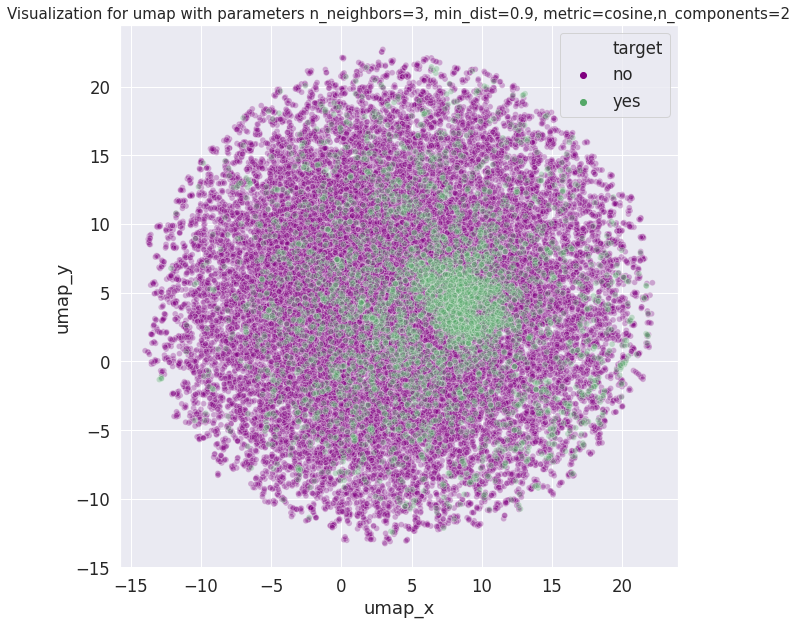

In [ ]:
min_dist=0.9
n_neighbors=3
metric='cosine'
n_components=2
umap_ = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric,n_components=2).fit_transform(new_data)
umap_2_data = pd.DataFrame(umap_,index=new_data.index)
umap_2_data["target"] = target
umap_2_data.columns = ['umap_x','umap_y','target']
sns.set(font_scale=1.5)
plt.figure(figsize=(10,10))
plt.title('Visualization for umap with parameters n_neighbors={}, min_dist={}, metric={},n_components={}'.format(n_neighbors,min_dist,metric,n_components),fontdict={'fontsize':15})
sns.scatterplot(
    x='umap_x',
    y='umap_y',
    hue='target',
    data=umap_2_data,
    alpha=0.3,
    palette=['purple','g']
    )
plt.show()

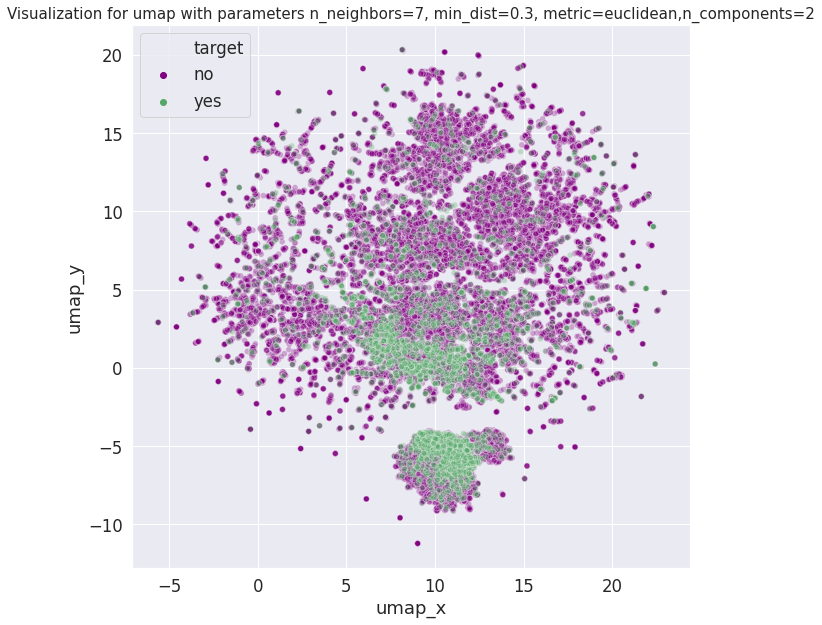

In [ ]:
min_dist=0.3
n_neighbors=7
metric='euclidean'
n_components=2
umap_ = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric,n_components=2).fit_transform(new_data)
umap_2_data = pd.DataFrame(umap_,index=new_data.index)
umap_2_data["target"] = target
umap_2_data.columns = ['umap_x','umap_y','target']
sns.set(font_scale=1.5)
plt.figure(figsize=(10,10))
plt.title('Visualization for umap with parameters n_neighbors={}, min_dist={}, metric={},n_components={}'.format(n_neighbors,min_dist,metric,n_components),fontdict={'fontsize':15})
sns.scatterplot(
    x='umap_x',
    y='umap_y',
    hue='target',
    data=umap_2_data,
    alpha=0.3,
    palette=['purple','g']
    )
plt.show()

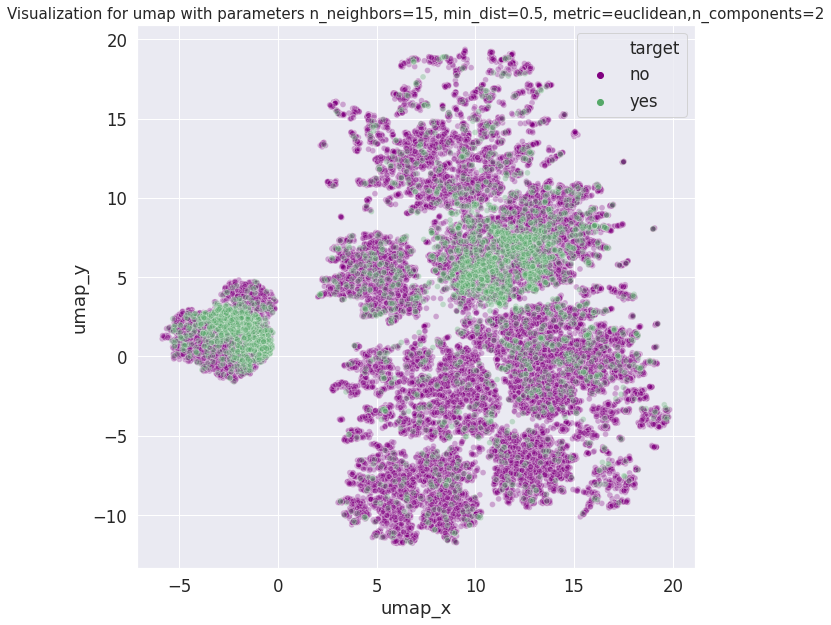

In [ ]:
min_dist=0.5
n_neighbors=15
metric='euclidean'
n_components=2
umap_ = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric,n_components=2).fit_transform(new_data)
umap_2_data = pd.DataFrame(umap_,index=new_data.index)
umap_2_data["target"] = target
umap_2_data.columns = ['umap_x','umap_y','target']
sns.set(font_scale=1.5)
plt.figure(figsize=(10,10))
plt.title('Visualization for umap with parameters n_neighbors={}, min_dist={}, metric={},n_components={}'.format(n_neighbors,min_dist,metric,n_components),fontdict={'fontsize':15})
sns.scatterplot(
    x='umap_x',
    y='umap_y',
    hue='target',
    data=umap_2_data,
    alpha=0.3,
    palette=['purple','g']
    )
plt.show()

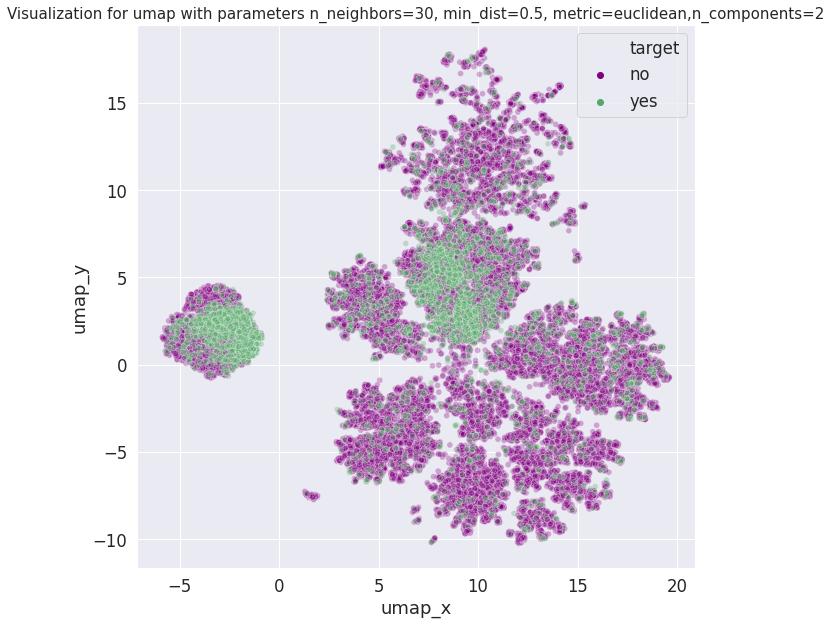

In [ ]:
min_dist=0.5
n_neighbors=30
metric='euclidean'
n_components=2
umap_ = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric,n_components=2).fit_transform(new_data)
umap_2_data = pd.DataFrame(umap_,index=new_data.index)
umap_2_data["target"] = target
umap_2_data.columns = ['umap_x','umap_y','target']
sns.set(font_scale=1.5)
plt.figure(figsize=(10,10))
plt.title('Visualization for umap with parameters n_neighbors={}, min_dist={}, metric={},n_components={}'.format(n_neighbors,min_dist,metric,n_components),fontdict={'fontsize':15})
sns.scatterplot(
    x='umap_x',
    y='umap_y',
    hue='target',
    data=umap_2_data,
    alpha=0.3,
    palette=['purple','g']
    )
plt.show()

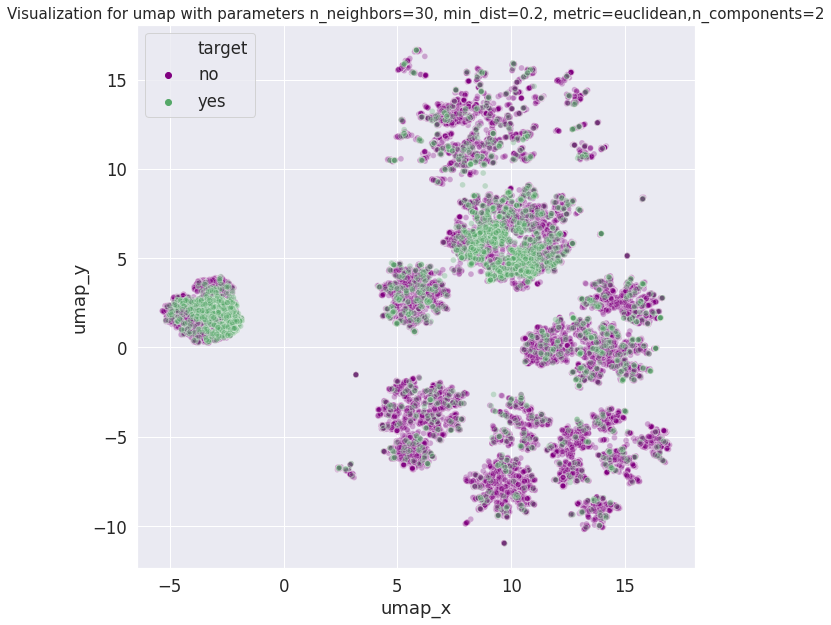

In [ ]:
min_dist=0.2
n_neighbors=30
metric='euclidean'
n_components=2
umap_ = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric,n_components=2).fit_transform(new_data)
umap_2_data = pd.DataFrame(umap_,index=new_data.index)
umap_2_data["target"] = target
umap_2_data.columns = ['umap_x','umap_y','target']
sns.set(font_scale=1.5)
plt.figure(figsize=(10,10))
plt.title('Visualization for umap with parameters n_neighbors={}, min_dist={}, metric={},n_components={}'.format(n_neighbors,min_dist,metric,n_components),fontdict={'fontsize':15})
sns.scatterplot(
    x='umap_x',
    y='umap_y',
    hue='target',
    data=umap_2_data,
    alpha=0.3,
    palette=['purple','g']
    )
plt.show()

Изменяя параметр 'n_neigbors' мы можем влиять на то, что важнее сохранить в новом пространственном представлении данных: глобальную или локальную структуру данных. При больших значениях алгоритм стремится сохранить глобальную структуру, упуская детали, при меньших - наоборот. Низкие значения параметра 'min_dist' помогают понять на какие кластеры какие кластеры разделяются ваши данные, а высокие — позволяют взглянуть на структуру данных, как единого целого.